# Start
First, we attached sensors to different individuals and recorded plantar foot forces using various sensors under different conditions.  
The forces include heel force, midfoot force, and arch force.  
The data were recorded separately for the right and left feet and collected at different time points.   
The time interval changes by 0.01 seconds.  
The surfaces include: ["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"].  
The input files are in `.txt` format.  
First, we read all the files, and then proceed to analyze each dataset.

Import library

In [1]:
#basic
import os
import math

#analysis
import numpy as np
import pandas as pd

#Statistik
import scipy.stats as stats

#plot
import matplotlib.pyplot as plt
import seaborn as sns

# folder Force data (novel loadsol 2)
Time[secs]: Zeit  
Heel: Ferse   
Midfoot: Fußgewölbe  
Forefoot: Zehe  
![Foot](foot.jpeg)


In [2]:
file_path = r"C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/Force data/loadsolASCII_25-11-11 09-24-19-079.txt"


df = pd.read_csv(
    file_path,
    sep="\t",        
    decimal=",", )    

df.head()

,Time[secs],PRY201_L_Heel,PRY201_L_Midfoot,PRY201_L_Forefoot,PRY201_L,Time[secs].1,PRY202_R_Forefoot,PRY202_R_Midfoot,PRY202_R_Heel,PRY202_R
0,0,99.71,124.49,147.5,371.7,0,119.68,99.84,157.44,376.96
1,0.01,102.07,124.49,147.5,374.06,0.01,122.24,99.84,160,382.08
2,0.02,99.71,122.13,144.55,366.39,0.02,119.68,99.84,160,379.52
3,0.03,99.71,122.13,142.19,364.03,0.03,122.24,102.4,160,384.64
4,0.04,97.35,122.13,142.19,361.67,0.04,124.8,102.4,160,387.2


# Read all data for analyis

In [3]:
#path
path = r"C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/All by category"

# read all data when that is .txt
file_names = [f for f in os.listdir(path) if f.endswith('.txt')]

#clear name and remove space and - from name
def sanitize_name(name: str) -> str:
    name = name.replace(".txt", "")
    name = name.replace(" ", "_").replace("-", "_")
    name = ''.join(c if c.isalnum() or c == '_' else '_' for c in name)
    if name and name[0].isdigit():
        name = '_' + name
    return name


list_name_dataframe=[]
# read all data
for file_name in file_names:
    var_name = sanitize_name(file_name)
    file_path = os.path.join(path, file_name)
    
    print(f" file: {var_name} -- name dataframe: {file_name}")
    
    try:
        df = pd.read_csv(
            file_path,
            sep="\t",
            decimal=",",
            engine="python"
        )
        df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
        
        #creat one liest by name of datafram
        list_name_dataframe.append(var_name)

        # name of data frame
        globals()[var_name] = df
        
        
    except Exception as e:
        print(f" --------Error---- {file_name}: {e}")



 file: loadsolASCII_25_11_11_09_24_19_079_Gravel -- name dataframe: loadsolASCII_25-11-11 09-24-19-079_Gravel.txt
 file: loadsolASCII_25_11_11_09_38_11_074_Asphalt -- name dataframe: loadsolASCII_25-11-11 09-38-11-074_Asphalt.txt
 file: loadsolASCII_25_11_11_09_52_01_474_Sand -- name dataframe: loadsolASCII_25-11-11 09-52-01-474_Sand.txt
 file: loadsolASCII_25_11_11_10_06_34_305_Grass -- name dataframe: loadsolASCII_25-11-11 10-06-34-305_Grass.txt
 file: loadsolASCII_25_11_11_10_09_51_519_Grass -- name dataframe: loadsolASCII_25-11-11 10-09-51-519_Grass.txt
 file: loadsolASCII_25_11_11_13_49_21_080_Grass -- name dataframe: loadsolASCII_25-11-11 13-49-21-080_Grass.txt
 file: loadsolASCII_25_11_11_13_54_44_511_Grass -- name dataframe: loadsolASCII_25-11-11 13-54-44-511_Grass.txt
 file: loadsolASCII_25_11_11_14_09_23_595_Sand -- name dataframe: loadsolASCII_25-11-11 14-09-23-595_Sand.txt
 file: loadsolASCII_25_11_11_14_21_20_634_Asphalt -- name dataframe: loadsolASCII_25-11-11 14-21-20-63

read and save as csv

In [4]:
input_path = r"C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/All by category"
output_path = r"C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/Data as scv"  # اصلاح شد: ata → data

os.makedirs(output_path, exist_ok=True)

file_names = [f for f in os.listdir(input_path) if f.endswith('.txt')]

def sanitize_name(name: str) -> str:
    name = name.replace(".txt", "")
    name = name.replace(" ", "_").replace("-", "_")
    name = ''.join(c if c.isalnum() or c == '_' else '_' for c in name)
    if name and name[0].isdigit():
        name = '_' + name
    return name

for file_name in file_names:
    var_name = sanitize_name(file_name)
    input_file = os.path.join(input_path, file_name)
    output_file = os.path.join(output_path, f"{var_name}.csv")
    
    try:
        df = pd.read_csv(input_file, sep="\t", decimal=",", engine="python")
        df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
        df.to_csv(output_file, index=False)
        print(f"Saved: {output_file}")
    except Exception as e:
        print(f"Error: {file_name} - {e}")

Saved: C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/Data as scv\loadsolASCII_25_11_11_09_24_19_079_Gravel.csv
Saved: C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/Data as scv\loadsolASCII_25_11_11_09_38_11_074_Asphalt.csv
Saved: C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/Data as scv\loadsolASCII_25_11_11_09_52_01_474_Sand.csv
Saved: C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/Data as scv\loadsolASCII_25_11_11_10_06_34_305_Grass.csv
Saved: C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bewegung/Bewegunganalysieren/Bewegung/data/raw/Force data (novel loadsol 2)/Data as scv\loadsolASCII_25_11_11_10_09_51_519_Grass.csv
Saved: C:/Users/abolhassni/Desktop/TU Darmstadt/Term 2/bew

## 1. list of dataframe by category
select one category


In [5]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][1]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)]
list_of_dataframe_mask

,category
1,loadsolASCII_25_11_11_09_38_11_074_Asphalt
8,loadsolASCII_25_11_11_14_21_20_634_Asphalt
10,loadsolASCII_25_11_13_10_16_07_282_Asphalt
18,loadsolASCII_25_11_13_14_44_02_331_Asphalt
21,loadsolASCII_25_11_14_10_00_15_439_Asphalt
24,loadsolASCII_25_11_16_14_07_55_722_Asphalt
31,loadsolASCII_25_11_17_10_09_36_341_Asphalt


1.1. Data about loadsolASCII_25_11_11_09_38_11_074

In [6]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt.head(5)

,Time[secs],PRY201_L_Heel,PRY201_L_Midfoot,PRY201_L_Forefoot,PRY201_L,Time[secs].1,PRY202_R_Forefoot,PRY202_R_Midfoot,PRY202_R_Heel,PRY202_R
0,0.00,182.04,162.06,127.28,471.38,0.00,84.68,99.76,145.00,329.44
1,0.01,182.04,162.06,127.28,471.38,0.01,84.68,99.76,142.10,326.54
2,0.02,185.00,164.28,127.28,476.56,0.02,87.00,99.76,142.10,328.86
3,0.03,182.04,162.06,127.28,471.38,0.03,87.00,99.76,139.78,326.54
4,0.04,182.04,164.28,127.28,473.60,0.04,87.00,99.76,137.46,324.22


1.2. Is not any NULL

In [7]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt.isnull().sum()

Time[secs]           0
PRY201_L_Heel        0
PRY201_L_Midfoot     0
PRY201_L_Forefoot    0
PRY201_L             0
Time[secs].1         0
PRY202_R_Forefoot    0
PRY202_R_Midfoot     0
PRY202_R_Heel        0
PRY202_R             0
dtype: int64

In [8]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20760 entries, 0 to 20759
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Time[secs]         20760 non-null  float64
 1   PRY201_L_Heel      20760 non-null  float64
 2   PRY201_L_Midfoot   20760 non-null  float64
 3   PRY201_L_Forefoot  20760 non-null  float64
 4   PRY201_L           20760 non-null  float64
 5   Time[secs].1       20760 non-null  float64
 6   PRY202_R_Forefoot  20760 non-null  float64
 7   PRY202_R_Midfoot   20760 non-null  float64
 8   PRY202_R_Heel      20760 non-null  float64
 9   PRY202_R           20760 non-null  float64
dtypes: float64(10)
memory usage: 1.6 MB


The minimum value for the right foot is reported as -1, but the sum is zero. This suggests an issue in the data recording process, and those values should likely be zero.

In [9]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt.describe()

,Time[secs],PRY201_L_Heel,PRY201_L_Midfoot,PRY201_L_Forefoot,PRY201_L,Time[secs].1,PRY202_R_Forefoot,PRY202_R_Midfoot,PRY202_R_Heel,PRY202_R
count,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000
mean,103.795000,118.393413,121.036095,163.689862,403.119369,103.795000,172.022418,92.143819,106.275951,370.444355
std,59.930401,201.471657,192.086676,251.682801,488.225529,59.930401,269.158161,173.775722,209.517378,492.541484
min,0.000000,0.000000,0.000000,0.000000,2.510000,0.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,51.897500,7.500000,4.980000,0.000000,19.950000,51.897500,0.000000,0.000000,0.000000,4.960000
50%,103.795000,12.500000,9.960000,5.000000,49.620000,103.795000,9.750000,0.000000,2.400000,49.805000
75%,155.692500,163.432500,194.880000,231.020000,765.600000,155.692500,253.937500,68.500000,94.510000,749.360000
max,207.590000,1040.000000,707.370000,982.500000,1571.220000,207.590000,1057.500000,653.250000,1072.500000,1568.700000


In [10]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt = loadsolASCII_25_11_11_09_38_11_074_Asphalt.replace(-1, 0)
loadsolASCII_25_11_11_09_38_11_074_Asphalt.describe()

,Time[secs],PRY201_L_Heel,PRY201_L_Midfoot,PRY201_L_Forefoot,PRY201_L,Time[secs].1,PRY202_R_Forefoot,PRY202_R_Midfoot,PRY202_R_Heel,PRY202_R
count,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000,20760.000000
mean,103.795000,118.393413,121.036095,163.689862,403.119369,103.795000,172.023140,92.144541,106.276673,370.444355
std,59.930401,201.471657,192.086676,251.682801,488.225529,59.930401,269.157698,173.775337,209.517010,492.541484
min,0.000000,0.000000,0.000000,0.000000,2.510000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,51.897500,7.500000,4.980000,0.000000,19.950000,51.897500,0.000000,0.000000,0.000000,4.960000
50%,103.795000,12.500000,9.960000,5.000000,49.620000,103.795000,9.750000,0.000000,2.400000,49.805000
75%,155.692500,163.432500,194.880000,231.020000,765.600000,155.692500,253.937500,68.500000,94.510000,749.360000
max,207.590000,1040.000000,707.370000,982.500000,1571.220000,207.590000,1057.500000,653.250000,1072.500000,1568.700000


1.3. We compared the right and left feet.

1.3.1. Heel Force
The averages are close to each other, which is what we expected.  
The standard deviations are close to each other, which is what we expected.  
Based on the quartiles, a small difference is observed in the second quartile, but this difference becomes substantial in the third quartile.  
Given that the means and standard deviations are close to each other, and considering that the maximum values are also similar, it can be inferred that the right foot likely exhibits greater force fluctuations compared to the left foot.

In [11]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt[["PRY201_L_Heel","PRY202_R_Heel"]].describe()

,PRY201_L_Heel,PRY202_R_Heel
count,20760.000000,20760.000000
mean,118.393413,106.276673
std,201.471657,209.517010
min,0.000000,0.000000
25%,7.500000,0.000000
50%,12.500000,2.400000
75%,163.432500,94.510000
max,1040.000000,1072.500000


Based on the total forces — which are higher on the left foot compared to the right — and also the average forces, which again are greater on the left side, we can conclude that the dominant foot is the left foot.
The reason the right foot shows a higher maximum force is that the standard deviations are very close; at certain points, the participant unintentionally applied more force on the right foot to maintain a straight walking path and compensate for a natural tendency to drift to the left.

In [12]:
print(f"Left Heel force: {loadsolASCII_25_11_11_09_38_11_074_Asphalt["PRY201_L_Heel"].sum()}")
print(f"Right Heel force: {loadsolASCII_25_11_11_09_38_11_074_Asphalt["PRY202_R_Heel"].sum()}")

Left Heel force: 2457847.25
Right Heel force: 2206303.74


The plot clearly shows that the subject began walking around second 15. The data after second 15 exhibits a walking pattern, as evidenced by the alternating force profile: when the right foot force approaches zero, the left foot reaches its local maximum, and vice versa.

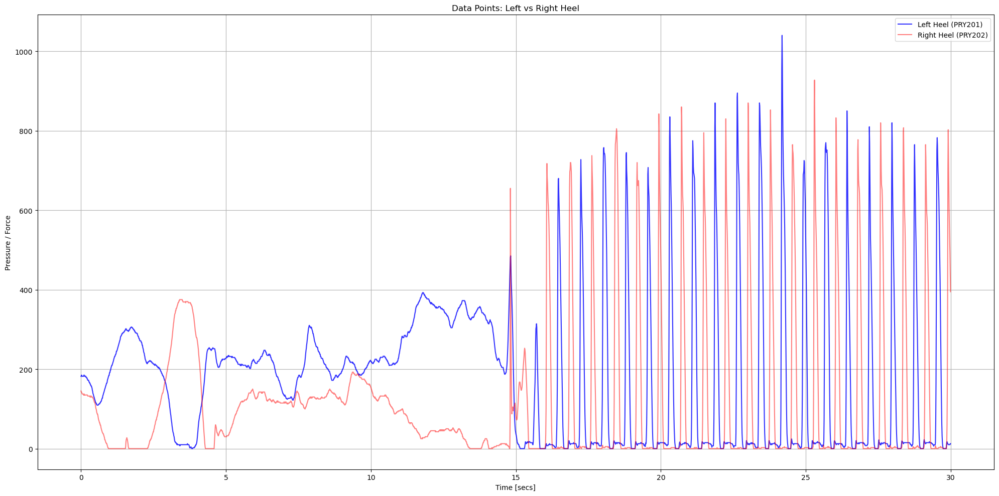

In [13]:
df_first = loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[:3000]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['PRY201_L_Heel'],
         label='Left Heel (PRY201)', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['PRY202_R_Heel'],
         label='Right Heel (PRY202)', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Furthermore, from around second 195 onward, the subject appears to exhibit behaviors resembling standing still or taking short, irregular steps—likely due to the conclusion of the experimental protocol—resulting in signal dropouts. From approximately second 202 onward, the data suggests the subject is standing upright on both feet.

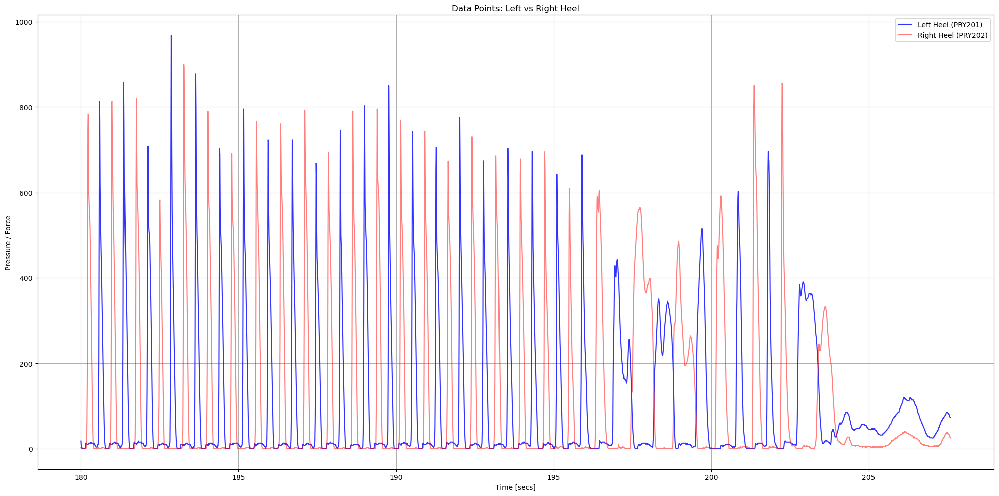

In [14]:
df_end = loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[18000:]

plt.figure(figsize=(20, 10))

plt.plot(df_end['Time[secs]'],
         df_end['PRY201_L_Heel'],
         label='Left Heel (PRY201)', color='blue', alpha=0.80)

plt.plot(df_end['Time[secs]'],
         df_end['PRY202_R_Heel'],
         label='Right Heel (PRY202)', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

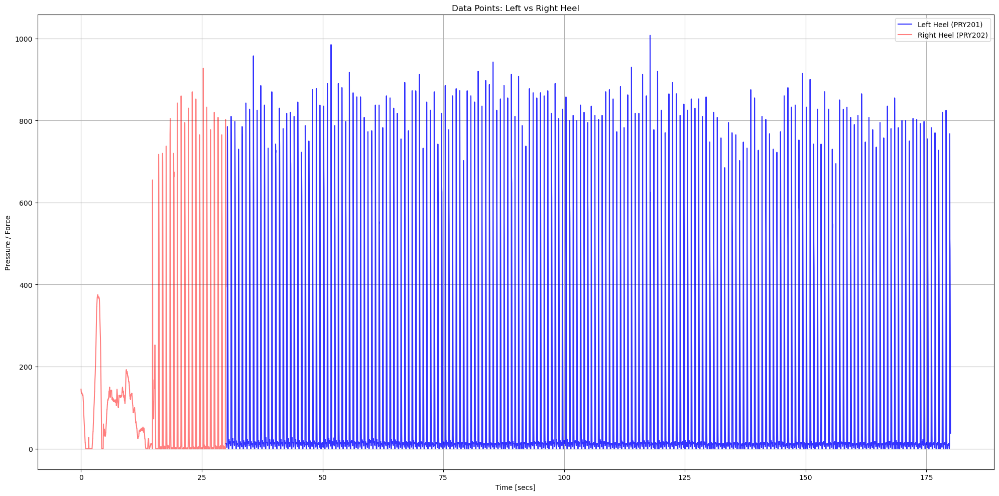

In [15]:
df_mid = loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[3000:18000]

plt.figure(figsize=(20, 10))

plt.plot(df_mid['Time[secs]'],
         df_mid['PRY201_L_Heel'],
         label='Left Heel (PRY201)', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['PRY202_R_Heel'],
         label='Right Heel (PRY202)', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the histogram and the number of zeros in the right and left foot data — as well as the frequency of values close to zero for both sides — it is likely that the participant slightly drags the left foot on the ground. In other words, considering the previous reasoning that the left foot is the dominant one, this suggests that the left foot is being dragged a little during walking.

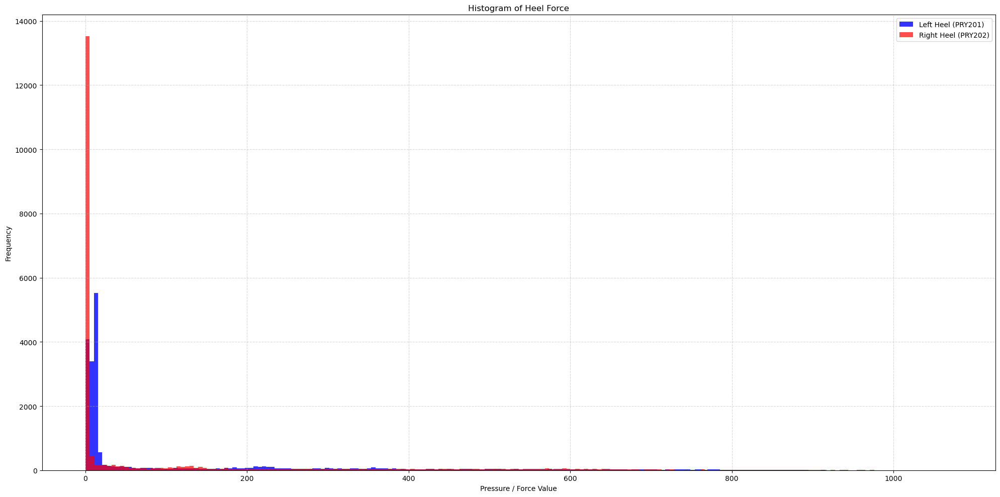

In [16]:
df = loadsolASCII_25_11_11_09_38_11_074_Asphalt

plt.figure(figsize=(20, 10))
plt.hist(df['PRY201_L_Heel'],
         bins=200, alpha=0.80,
         label='Left Heel (PRY201)',
         color='blue')

plt.hist(df['PRY202_R_Heel'],
         bins=200,
         alpha=0.70,
         label='Right Heel (PRY202)',
         color='red')

plt.xlabel('Pressure / Force Value')
plt.ylabel('Frequency')
plt.title('Histogram of Heel Force')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

Based on the Shapiro test from the SciPy library, which examines normality, the data distribution in this dataset is not normal.

In [17]:
df = loadsolASCII_25_11_11_09_38_11_074_Asphalt


# drop null (have not any null)
left_data = df['PRY201_L_Heel'].dropna()
right_data = df['PRY202_R_Heel'].dropna()

# shapiro Test for left
stat_left, p_left = stats.shapiro(left_data)
print(f"Left Heel (PRY201) — Shapiro Statistic: {stat_left:.4f}, p-value: {p_left:.4f}")

# shapiro Test for right
stat_right, p_right = stats.shapiro(right_data)
print(f"Right Heel (PRY202) — Shapiro Statistic: {stat_right:.4f}, p-value: {p_right:.4f}")

# Is normal or not
print("-------is normal or Not-----------")
alpha = 0.05
if p_left > alpha:
    print("Left Heel data is normally distributed (fail to reject H0)")
else:
    print("Left Heel data is NOT normally distributed (reject H0)")

if p_right > alpha:
    print("Right Heel data is normally distributed (fail to reject H0)")
else:
    print("Right Heel data is NOT normally distributed (reject H0)")

Left Heel (PRY201) — Shapiro Statistic: 0.6364, p-value: 0.0000
Right Heel (PRY202) — Shapiro Statistic: 0.5794, p-value: 0.0000
-------is normal or Not-----------
Left Heel data is NOT normally distributed (reject H0)
Right Heel data is NOT normally distributed (reject H0)


c:\Users\abolhassni\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 20760.
  res = hypotest_fun_out(*samples, **kwds)


1.3.2. we want ro campare the right midfoot with the left midfoot   
Given the mean force, standard deviation, and maximum force, the hypothesis of foot posture gains more strength.  
As can be seen, the force at the midfoot of the right and left feet shows a greater difference compared to each other, which, when considering heel force analysis, further strengthens this hypothesis.

In [18]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt[["PRY201_L_Midfoot","PRY202_R_Midfoot"]].describe()

,PRY201_L_Midfoot,PRY202_R_Midfoot
count,20760.000000,20760.000000
mean,121.036095,92.144541
std,192.086676,173.775337
min,0.000000,0.000000
25%,4.980000,0.000000
50%,9.960000,0.000000
75%,194.880000,68.500000
max,707.370000,653.250000


In [19]:
print(f"Left Heel force: {loadsolASCII_25_11_11_09_38_11_074_Asphalt["PRY201_L_Midfoot"].sum()}")
print(f"Right Heel force: {loadsolASCII_25_11_11_09_38_11_074_Asphalt["PRY202_R_Midfoot"].sum()}")

Left Heel force: 2512709.33
Right Heel force: 1912920.68


this chart shows the midfoot force of both midfoot 
each peak represents a step.  
Comparing heel force and midfoot force, the force behavior is similar; however, contrary to our expectation, the force under the foot is lower. The reason for this is the increased contact area: in the heel, the surface area under force is smaller, and according to the pressure formula, this results in higher pressure.  
Interestingly, the midfoot force of the left foot is greater than the heel force of the left foot, while the midfoot force of the right foot is less than the heel force of the right foot—in other words, the heel forces of the right and left feet lie between the midfoot forces of the right and left feet. This occurred while the person was standing.


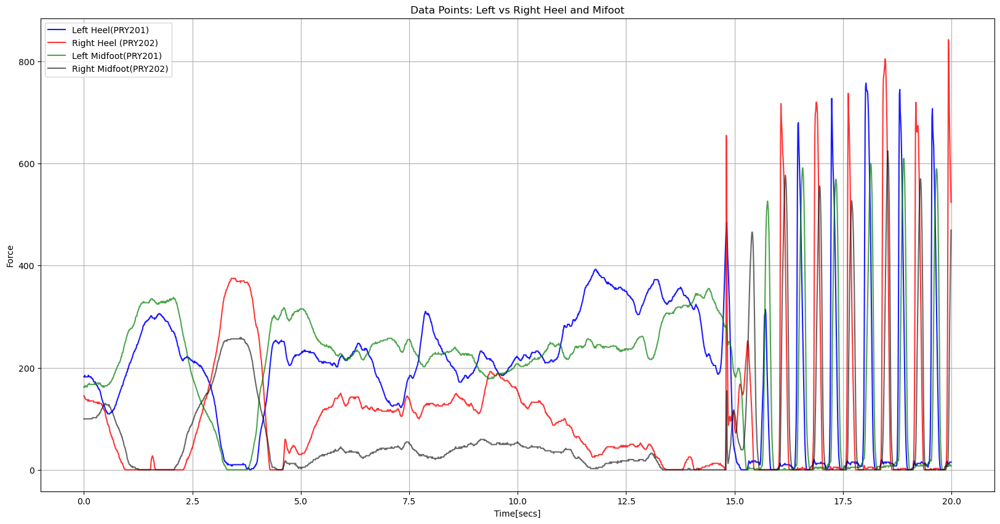

In [20]:
df_first=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[:2000]
plt.figure(figsize=(20,10))
plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Heel"],
         label="Left Heel(PRY201)", color="blue", alpha=0.9)
plt.plot(df_first["Time[secs]"],
         df_first["PRY202_R_Heel"],
         label="Right Heel (PRY202)", color="red", alpha=0.8)

plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Midfoot"],
         label="Left Midfoot(PRY201)", color="green", alpha=0.7)
plt.plot(df_first["Time[secs]"],
         df_first["PRY202_R_Midfoot"],
         label="Right Midfoot(PRY202)", color="black", alpha=0.6)

plt.xlabel("Time[secs]")
plt.ylabel("Force")
plt.title("Data Points: Left vs Right Heel and Mifoot")
plt.legend()
plt.grid(True)
plt.show()


the graph shows the end of the movement. the regular step peaks disappear, the force becoms small and irregular and both feet show similar paterns . this happens because the person stops walking or slows down, so the midfoot force naturally becomes unstable and low.  
The same phenomenon observed at the beginning also occurs at the end of the test, with the force under the midfoot being greater than the force under the heel.

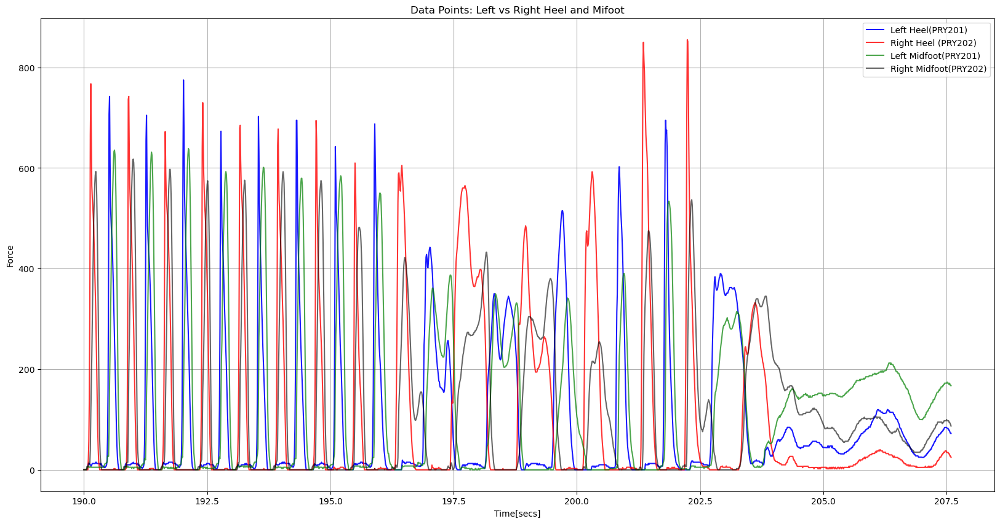

In [21]:
df_end=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[19000:]

plt.figure(figsize=(20,10))
plt.plot(df_end['Time[secs]'],
         df_end["PRY201_L_Heel"],
         label="Left Heel(PRY201)", color="blue", alpha=0.9)
plt.plot(df_end["Time[secs]"],
         df_end["PRY202_R_Heel"],
         label="Right Heel (PRY202)", color="red", alpha=0.8)

plt.plot(df_end['Time[secs]'],
         df_end["PRY201_L_Midfoot"],
         label="Left Midfoot(PRY201)", color="green", alpha=0.7)
plt.plot(df_end["Time[secs]"],
         df_end["PRY202_R_Midfoot"],
         label="Right Midfoot(PRY202)", color="black", alpha=0.6)

plt.xlabel("Time[secs]")
plt.ylabel("Force")
plt.title("Data Points: Left vs Right Heel and Mifoot")
plt.legend()
plt.grid(True)
plt.show()


According to the pressure equation, as the contact area increases, pressure decreases—this is clearly observable in the heel and midfoot forces.

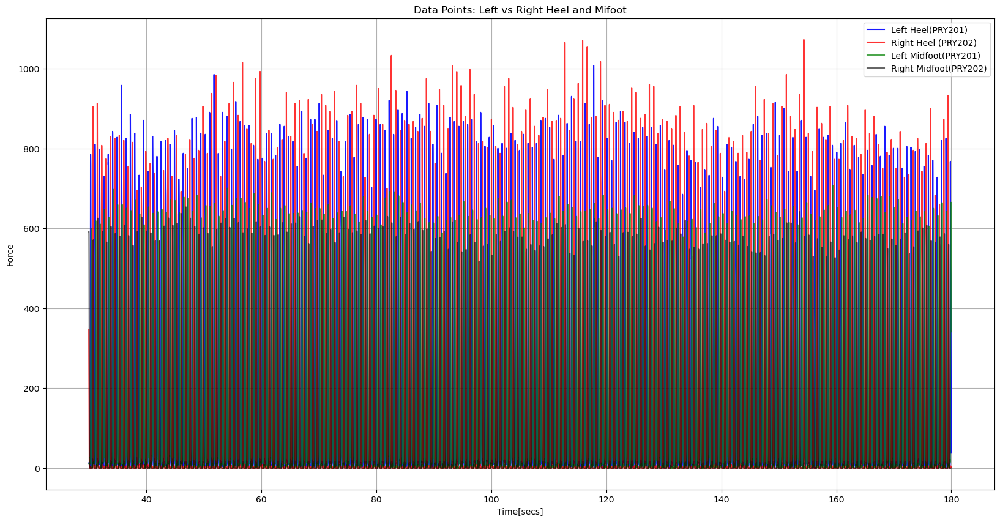

In [22]:
df_first=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[5000:15000]

plt.figure(figsize=(20,10))
plt.plot(df_mid['Time[secs]'],
         df_mid["PRY201_L_Heel"],
         label="Left Heel(PRY201)", color="blue", alpha=0.9)
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Heel"],
         label="Right Heel (PRY202)", color="red", alpha=0.8)

plt.plot(df_mid['Time[secs]'],
         df_mid["PRY201_L_Midfoot"],
         label="Left Midfoot(PRY201)", color="green", alpha=0.7)
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Midfoot"],
         label="Right Midfoot(PRY202)", color="black", alpha=0.6)

plt.xlabel("Time[secs]")
plt.ylabel("Force")
plt.title("Data Points: Left vs Right Heel and Mifoot")
plt.legend()
plt.grid(True)
plt.show()


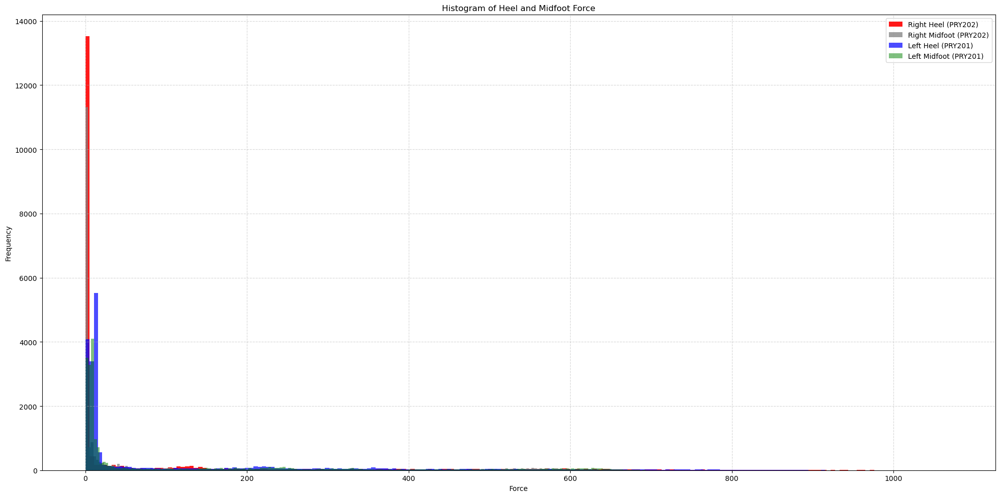

In [23]:
df = loadsolASCII_25_11_11_09_38_11_074_Asphalt

plt.figure(figsize=(20, 10))

plt.hist(df["PRY202_R_Heel"],
         bins=200,
         alpha=0.90,
         label='Right Heel (PRY202)',
         color='red')

plt.hist(df['PRY202_R_Midfoot'],
         bins=200,
         alpha=0.75,
         label='Right Midfoot (PRY202)',
         color='gray')


plt.hist(df["PRY201_L_Heel"],
         bins=200, alpha=0.70,
         label='Left Heel (PRY201)',
         color='blue')


plt.hist(df['PRY201_L_Midfoot'],
         bins=200, alpha=0.50,
         label='Left Midfoot (PRY201)',
         color='green')



plt.xlabel('Force')
plt.ylabel('Frequency')
plt.title('Histogram of Heel and Midfoot Force')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

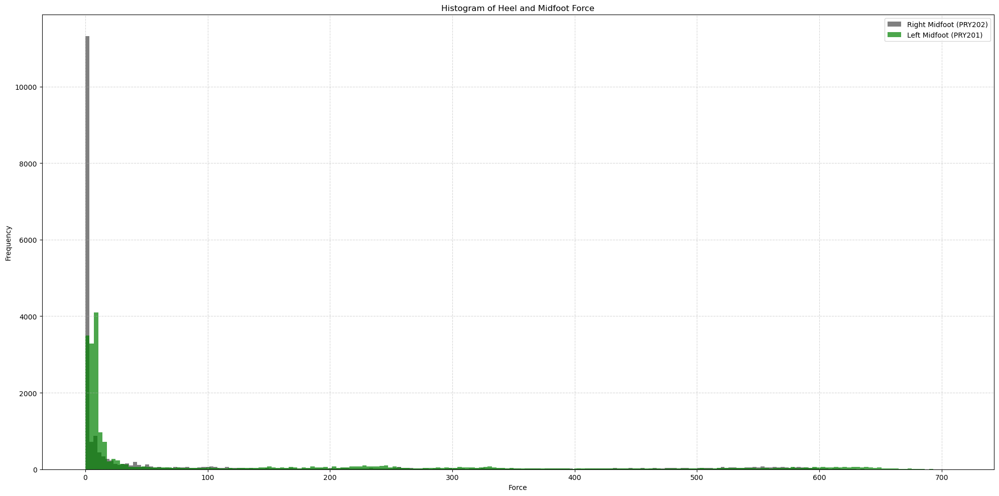

In [24]:
df = loadsolASCII_25_11_11_09_38_11_074_Asphalt

plt.figure(figsize=(20, 10))

plt.hist(df['PRY202_R_Midfoot'],
         bins=200,
         alpha=1.00,
         label='Right Midfoot (PRY202)',
         color='gray')

plt.hist(df['PRY201_L_Midfoot'],
         bins=200, alpha=0.70,
         label='Left Midfoot (PRY201)',
         color='green')


plt.xlabel('Force')
plt.ylabel('Frequency')
plt.title('Histogram of Heel and Midfoot Force')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

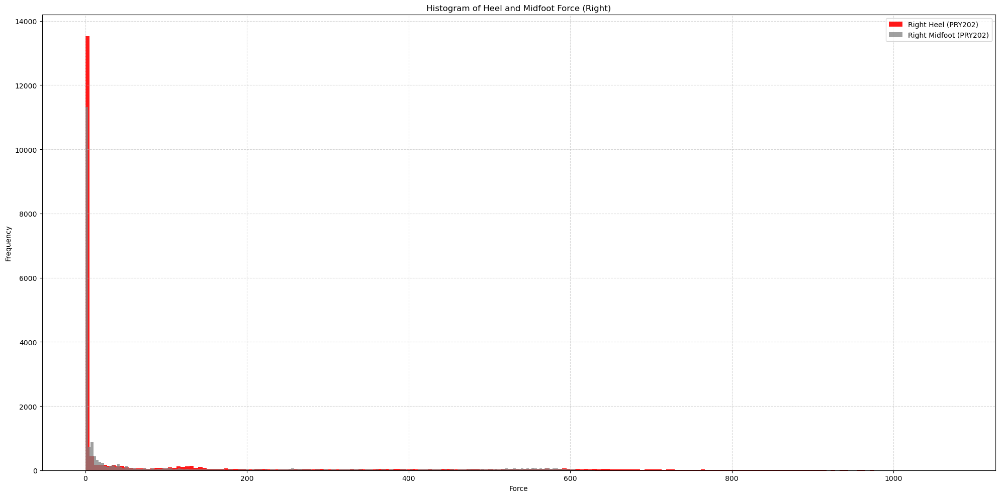

In [25]:
df = loadsolASCII_25_11_11_09_38_11_074_Asphalt

plt.figure(figsize=(20, 10))

plt.hist(df["PRY202_R_Heel"],
         bins=200,
         alpha=0.90,
         label='Right Heel (PRY202)',
         color='red')

plt.hist(df['PRY202_R_Midfoot'],
         bins=200,
         alpha=0.75,
         label='Right Midfoot (PRY202)',
         color='gray')


plt.xlabel('Force')
plt.ylabel('Frequency')
plt.title('Histogram of Heel and Midfoot Force (Right)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

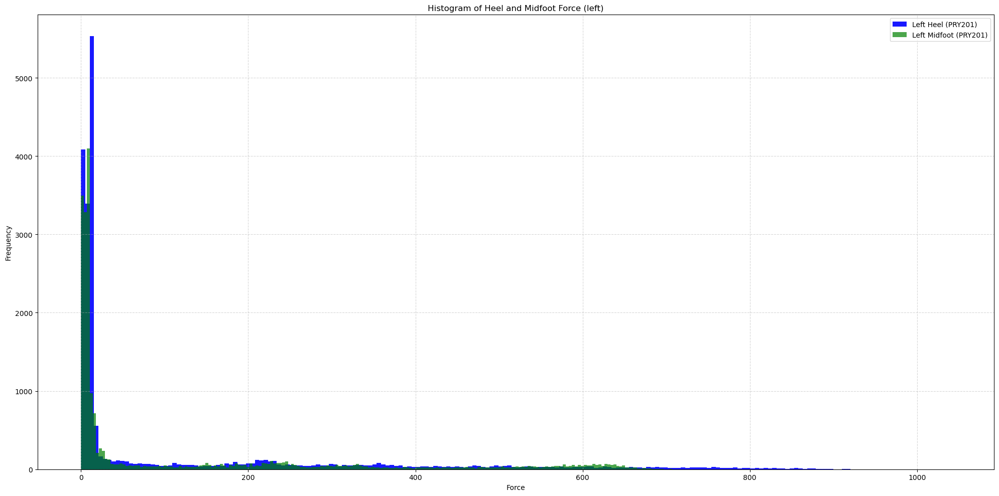

In [26]:
df = loadsolASCII_25_11_11_09_38_11_074_Asphalt

plt.figure(figsize=(20, 10))
plt.hist(df["PRY201_L_Heel"],
         bins=200,
         alpha=0.90,
         label='Left Heel (PRY201)',
         color='blue')

plt.hist(df['PRY201_L_Midfoot'],
         bins=200,
         alpha=0.70,
         label='Left Midfoot (PRY201)',
         color='green')


plt.xlabel('Force')
plt.ylabel('Frequency')
plt.title('Histogram of Heel and Midfoot Force (left)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


1.3.3. we want to compare Forefoot for both right and left foot

In [27]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt.head()

,Time[secs],PRY201_L_Heel,PRY201_L_Midfoot,PRY201_L_Forefoot,PRY201_L,Time[secs].1,PRY202_R_Forefoot,PRY202_R_Midfoot,PRY202_R_Heel,PRY202_R
0,0.00,182.04,162.06,127.28,471.38,0.00,84.68,99.76,145.00,329.44
1,0.01,182.04,162.06,127.28,471.38,0.01,84.68,99.76,142.10,326.54
2,0.02,185.00,164.28,127.28,476.56,0.02,87.00,99.76,142.10,328.86
3,0.03,182.04,162.06,127.28,471.38,0.03,87.00,99.76,139.78,326.54
4,0.04,182.04,164.28,127.28,473.60,0.04,87.00,99.76,137.46,324.22


In [28]:
loadsolASCII_25_11_11_09_38_11_074_Asphalt[["PRY201_L_Forefoot", "PRY202_R_Forefoot"]].describe()

,PRY201_L_Forefoot,PRY202_R_Forefoot
count,20760.000000,20760.000000
mean,163.689862,172.023140
std,251.682801,269.157698
min,0.000000,0.000000
25%,0.000000,0.000000
50%,5.000000,9.750000
75%,231.020000,253.937500
max,982.500000,1057.500000


In [29]:
print(f"Left Heel force: {loadsolASCII_25_11_11_09_38_11_074_Asphalt["PRY201_L_Forefoot"].sum()}")
print(f"Right Heel force: {loadsolASCII_25_11_11_09_38_11_074_Asphalt["PRY202_R_Forefoot"].sum()}")

Left Heel force: 3398201.5300000003
Right Heel force: 3571200.3899999997


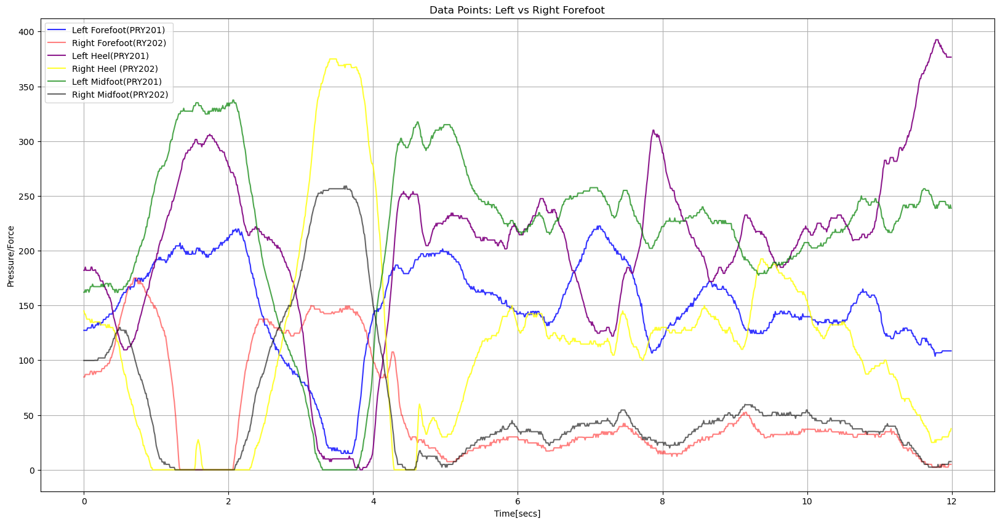

In [30]:
df_first=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[:1200]
plt.figure(figsize=(20,10))
plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Forefoot"],
         label="Left Forefoot(PRY201)", color="blue", alpha=0.8)

plt.plot(df_first['Time[secs]'],
         df_first["PRY202_R_Forefoot"],
         label="Right Forefoot(RY202) ", color="red", alpha=0.5)


plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Heel"],
         label="Left Heel(PRY201)", color="purple", alpha=0.9)
plt.plot(df_first["Time[secs]"],
         df_first["PRY202_R_Heel"],
         label="Right Heel (PRY202)", color="yellow", alpha=0.8)

plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Midfoot"],
         label="Left Midfoot(PRY201)", color="green", alpha=0.7)
plt.plot(df_first["Time[secs]"],
         df_first["PRY202_R_Midfoot"],
         label="Right Midfoot(PRY202)", color="black", alpha=0.6)

plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")

plt.legend()
plt.grid(True)
plt.show()

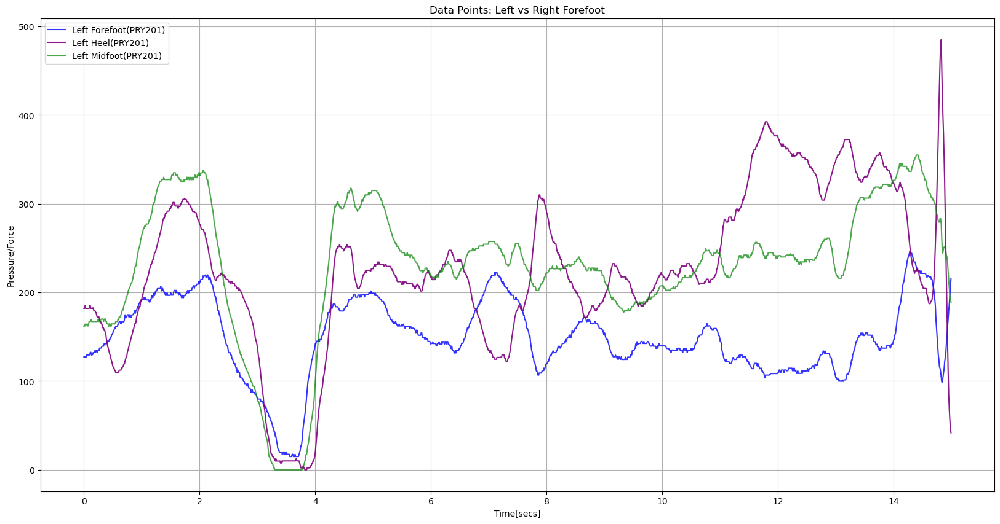

In [31]:
df_first=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[:1500]
plt.figure(figsize=(20,10))
plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Forefoot"],
         label="Left Forefoot(PRY201)", color="blue", alpha=0.8)

plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Heel"],
         label="Left Heel(PRY201)", color="purple", alpha=0.9)

plt.plot(df_first['Time[secs]'],
         df_first["PRY201_L_Midfoot"],
         label="Left Midfoot(PRY201)", color="green", alpha=0.7)

plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")

plt.legend()
plt.grid(True)
plt.show()

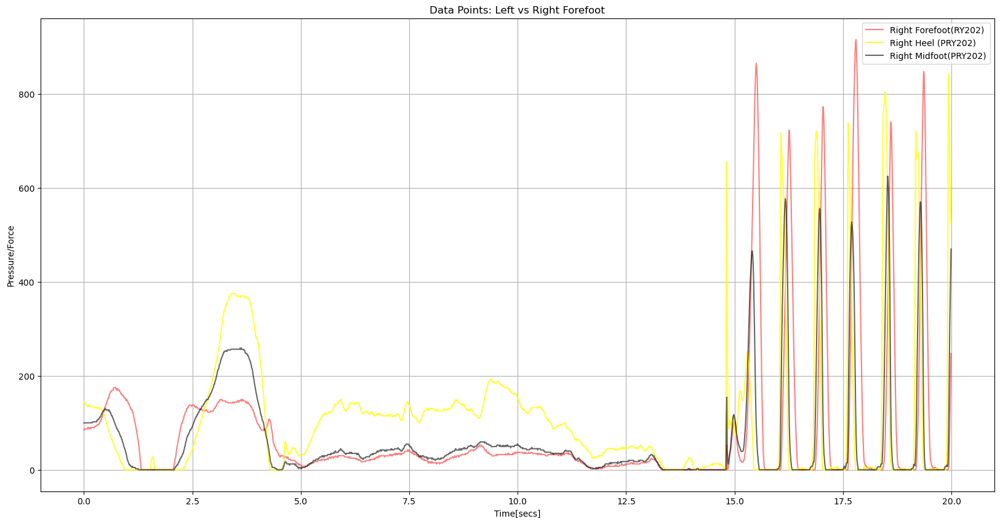

In [32]:
df_first=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[:2000]
plt.figure(figsize=(20,10))

plt.plot(df_first['Time[secs]'],
         df_first["PRY202_R_Forefoot"],
         label="Right Forefoot(RY202) ", color="red", alpha=0.5)

plt.plot(df_first["Time[secs]"],
         df_first["PRY202_R_Heel"],
         label="Right Heel (PRY202)", color="yellow", alpha=0.8)

plt.plot(df_first["Time[secs]"],
         df_first["PRY202_R_Midfoot"],
         label="Right Midfoot(PRY202)", color="black", alpha=0.6)

plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")

plt.legend()
plt.grid(True)
plt.show()

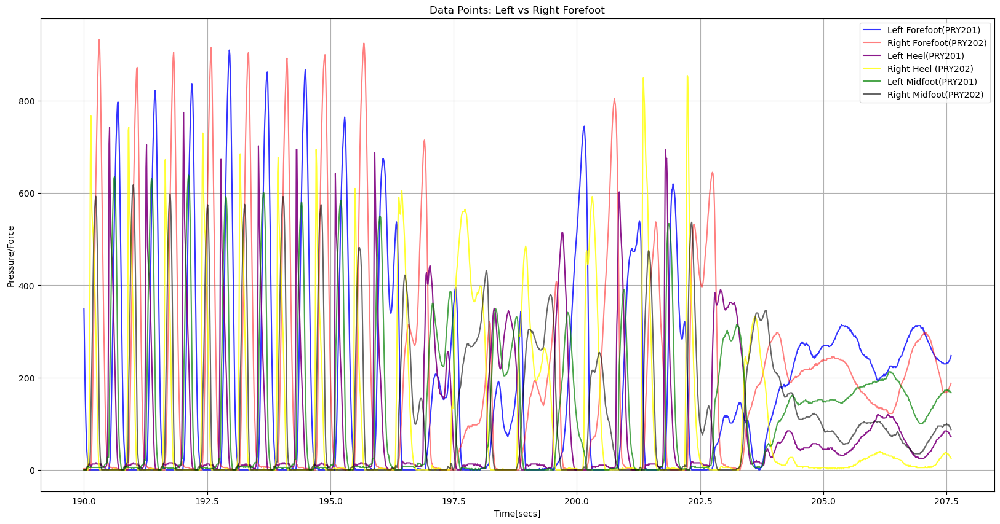

In [33]:
df_end=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[19000:]
plt.figure(figsize=(20,10))


plt.plot(df_end['Time[secs]'],
         df_end["PRY201_L_Forefoot"],
         label="Left Forefoot(PRY201)", color="blue", alpha=0.8)
plt.plot(df_end["Time[secs]"],
         df_end["PRY202_R_Forefoot"],
         label="Right Forefoot(PRY202)", color="red", alpha=0.50)

plt.plot(df_end['Time[secs]'],
         df_end["PRY201_L_Heel"],
         label="Left Heel(PRY201)", color="purple", alpha=0.9)
plt.plot(df_end["Time[secs]"],
         df_end["PRY202_R_Heel"],
         label="Right Heel (PRY202)", color="yellow", alpha=0.8)

plt.plot(df_end['Time[secs]'],
         df_end["PRY201_L_Midfoot"],
         label="Left Midfoot(PRY201)", color="green", alpha=0.7)
plt.plot(df_end["Time[secs]"],
         df_end["PRY202_R_Midfoot"],
         label="Right Midfoot(PRY202)", color="black", alpha=0.6)

plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")
plt.legend()
plt.grid(True)
plt.show()


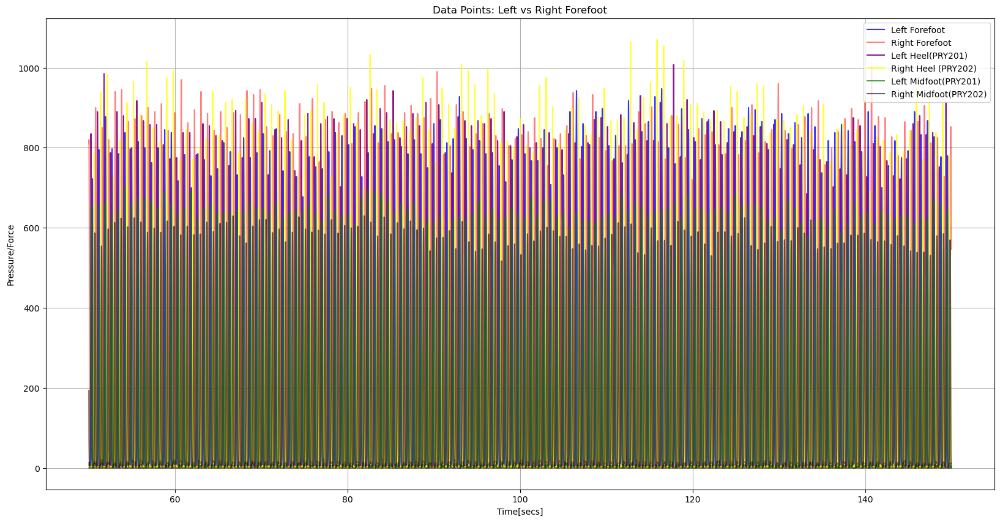

In [34]:
df_mid=loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[5000:15000]


plt.figure(figsize=(20,10))
plt.plot(df_mid["Time[secs]"],
        df_mid["PRY201_L_Forefoot"],
         label="Left Forefoot", color="blue", alpha=0.8)

plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Forefoot"],
         label="Right Forefoot", color="red", alpha=0.5)

plt.plot(df_mid['Time[secs]'],
         df_mid["PRY201_L_Heel"],
         label="Left Heel(PRY201)", color="purple", alpha=0.9)
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Heel"],
         label="Right Heel (PRY202)", color="yellow", alpha=0.8)

plt.plot(df_mid['Time[secs]'],
         df_mid["PRY201_L_Midfoot"],
         label="Left Midfoot(PRY201)", color="green", alpha=0.7)
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Midfoot"],
         label="Right Midfoot(PRY202)", color="black", alpha=0.6)


plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")


plt.legend()
plt.grid(True)
plt.show()

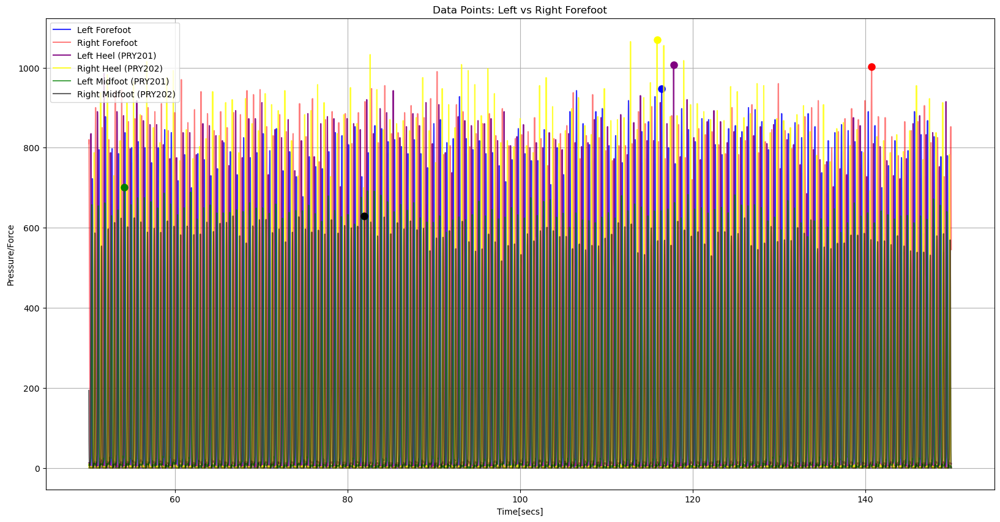

In [35]:
df_mid = loadsolASCII_25_11_11_09_38_11_074_Asphalt.iloc[5000:15000]

plt.figure(figsize=(20, 10))

# Forefoot Left
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY201_L_Forefoot"],
         label="Left Forefoot",
         color="blue",
         alpha=0.8)

idx_max = df_mid["PRY201_L_Forefoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRY201_L_Forefoot"], 'o',
         color="blue", markersize=8)

# Forefoot Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Forefoot"],
         label="Right Forefoot",
         color="red",
         alpha=0.5)
idx_max = df_mid["PRY202_R_Forefoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRY202_R_Forefoot"], 'o',
         color="red", markersize=8)

# Heel Left
plt.plot(df_mid["Time[secs]"], df_mid["PRY201_L_Heel"],
         label="Left Heel (PRY201)", color="purple", alpha=0.9)
idx_max = df_mid["PRY201_L_Heel"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRY201_L_Heel"], 'o',
         color="purple", markersize=8)

# Heel Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Heel"],
         label="Right Heel (PRY202)",
         color="yellow",
         alpha=0.8)
idx_max = df_mid["PRY202_R_Heel"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRY202_R_Heel"], 'o',
         color="yellow", markersize=8)

# Midfoot Left
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY201_L_Midfoot"],
         label="Left Midfoot (PRY201)",
         color="green",
         alpha=0.7)
idx_max = df_mid["PRY201_L_Midfoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRY201_L_Midfoot"], 'o',
         color="green",
         markersize=8)

# Midfoot Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRY202_R_Midfoot"],
         label="Right Midfoot (PRY202)",
         color="black",
         alpha=0.6)
idx_max = df_mid["PRY202_R_Midfoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRY202_R_Midfoot"], 'o',
         color="black", markersize=8)

plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

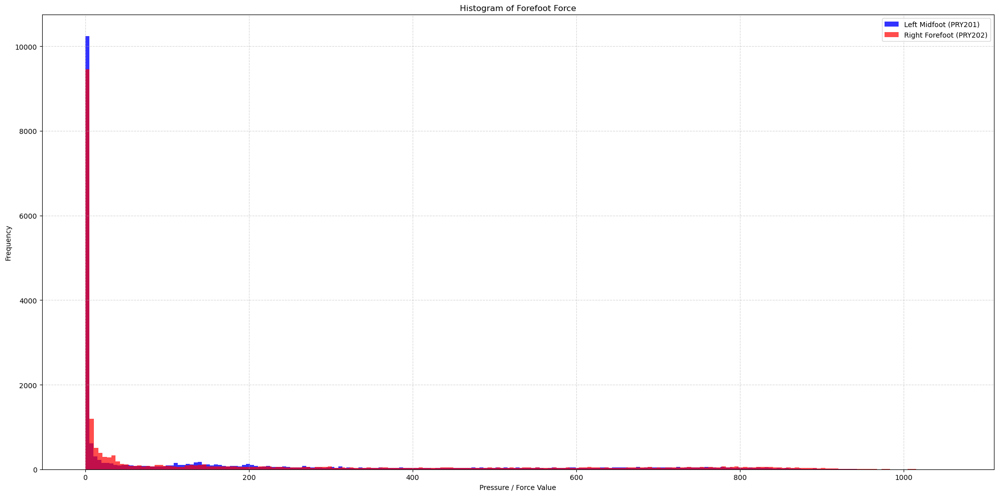

In [36]:
df = loadsolASCII_25_11_11_09_38_11_074_Asphalt

plt.figure(figsize=(20, 10))
plt.hist(df['PRY201_L_Forefoot'],
         bins=200, alpha=0.80,
         label='Left Midfoot (PRY201)',
         color='blue')

plt.hist(df['PRY202_R_Forefoot'],
         bins=200,
         alpha=0.70,
         label='Right Forefoot (PRY202)',
         color='red')

plt.xlabel('Pressure / Force Value')
plt.ylabel('Frequency')
plt.title('Histogram of Forefoot Force')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

we want to compare Left foot with right food of next experiment loadsolASCII_25_11_11_14_21_20_634_Asphalt

In [37]:
loadsolASCII_25_11_11_14_21_20_634_Asphalt.head()

,Time[secs],PRX333_L_Heel,PRX333_L_Midfoot,PRX333_L_Forefoot,PRX333_L,Time[secs].1,PRX334_R_Forefoot,PRX334_R_Midfoot,PRX334_R_Heel,PRX334_R
0,0.00,287.50,66.7,74.75,428.95,0.00,19.76,41.60,142.48,203.84
1,0.01,281.75,64.4,74.75,420.90,0.01,21.84,44.72,146.64,213.20
2,0.02,274.85,64.4,74.75,414.00,0.02,24.96,49.92,157.04,231.92
3,0.03,266.80,62.1,74.75,403.65,0.03,29.12,52.00,167.44,248.56
4,0.04,262.20,59.8,74.75,396.75,0.04,37.44,54.08,174.72,266.24


In [38]:
loadsolASCII_25_11_11_14_21_20_634_Asphalt = loadsolASCII_25_11_11_14_21_20_634_Asphalt.replace(-1, 0)

In [39]:
loadsolASCII_25_11_11_14_21_20_634_Asphalt=loadsolASCII_25_11_11_14_21_20_634_Asphalt.dropna()
loadsolASCII_25_11_11_14_21_20_634_Asphalt.isnull().sum()

Time[secs]           0
PRX333_L_Heel        0
PRX333_L_Midfoot     0
PRX333_L_Forefoot    0
PRX333_L             0
Time[secs].1         0
PRX334_R_Forefoot    0
PRX334_R_Midfoot     0
PRX334_R_Heel        0
PRX334_R             0
dtype: int64

In [40]:
loadsolASCII_25_11_11_14_21_20_634_Asphalt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20130 entries, 0 to 20129
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Time[secs]         20130 non-null  float64
 1   PRX333_L_Heel      20130 non-null  float64
 2   PRX333_L_Midfoot   20130 non-null  float64
 3   PRX333_L_Forefoot  20130 non-null  float64
 4   PRX333_L           20130 non-null  float64
 5   Time[secs].1       20130 non-null  float64
 6   PRX334_R_Forefoot  20130 non-null  float64
 7   PRX334_R_Midfoot   20130 non-null  float64
 8   PRX334_R_Heel      20130 non-null  float64
 9   PRX334_R           20130 non-null  float64
dtypes: float64(10)
memory usage: 1.7 MB


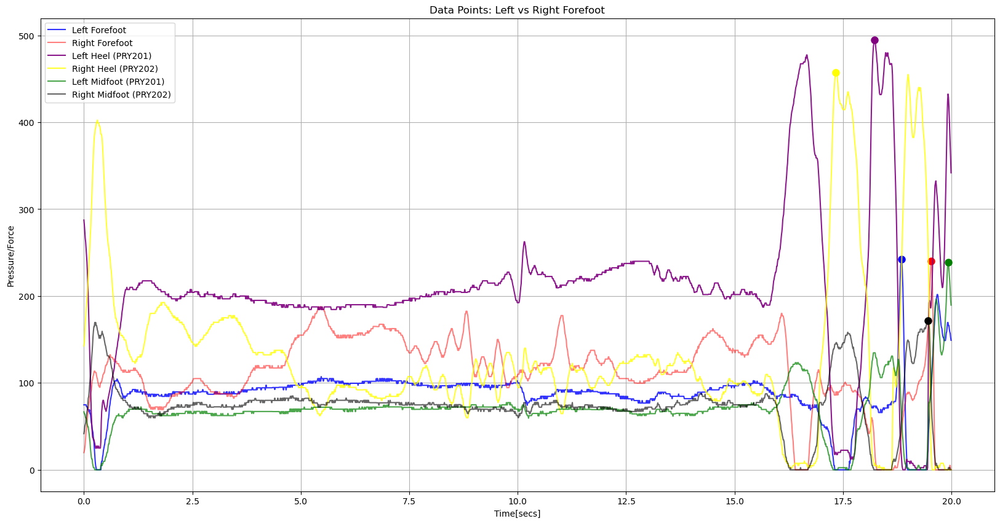

In [41]:
df_mid = loadsolASCII_25_11_11_14_21_20_634_Asphalt.iloc[:2000]

plt.figure(figsize=(20, 10))

# Forefoot Left
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX333_L_Forefoot"],
         label="Left Forefoot",
         color="blue",
         alpha=0.8)

idx_max = df_mid["PRX333_L_Forefoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX333_L_Forefoot"], 'o',
         color="blue", markersize=8)

# Forefoot Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX334_R_Forefoot"],
         label="Right Forefoot",
         color="red",
         alpha=0.5)
idx_max = df_mid["PRX334_R_Forefoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX334_R_Forefoot"], 'o',
         color="red", markersize=8)

# Heel Left
plt.plot(df_mid["Time[secs]"], df_mid["PRX333_L_Heel"],
         label="Left Heel (PRY201)", color="purple", alpha=0.9)
idx_max = df_mid["PRX333_L_Heel"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX333_L_Heel"], 'o',
         color="purple", markersize=8)

# Heel Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX334_R_Heel"],
         label="Right Heel (PRY202)",
         color="yellow",
         alpha=0.8)
idx_max = df_mid["PRX334_R_Heel"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX334_R_Heel"], 'o',
         color="yellow", markersize=8)

# Midfoot Left
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX333_L_Midfoot"],
         label="Left Midfoot (PRY201)",
         color="green",
         alpha=0.7)
idx_max = df_mid["PRX333_L_Midfoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX333_L_Midfoot"], 'o',
         color="green",
         markersize=8)

# Midfoot Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX334_R_Midfoot"],
         label="Right Midfoot (PRY202)",
         color="black",
         alpha=0.6)
idx_max = df_mid["PRX334_R_Midfoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX334_R_Midfoot"], 'o',
         color="black", markersize=8)

plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

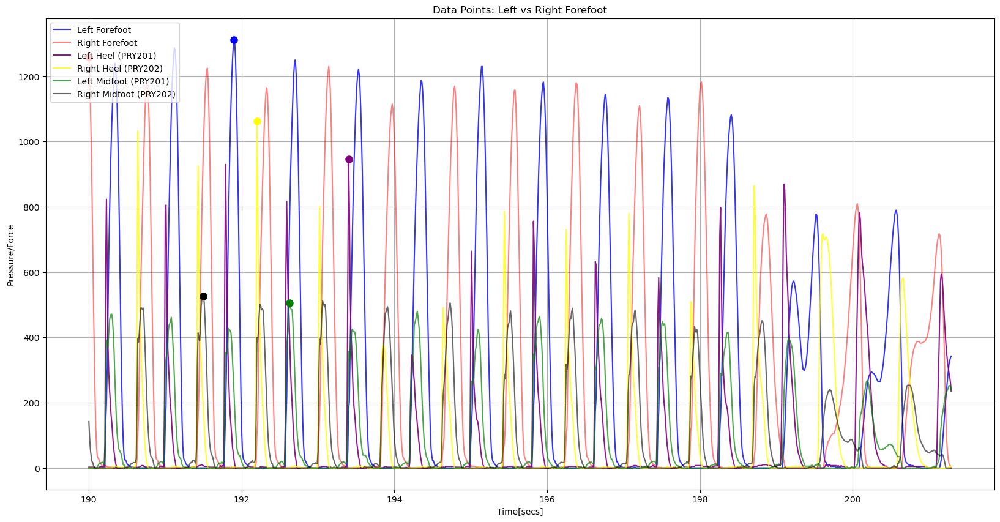

In [42]:
df_mid = loadsolASCII_25_11_11_14_21_20_634_Asphalt.iloc[19000:]

plt.figure(figsize=(20, 10))

# Forefoot Left
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX333_L_Forefoot"],
         label="Left Forefoot",
         color="blue",
         alpha=0.8)

idx_max = df_mid["PRX333_L_Forefoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX333_L_Forefoot"], 'o',
         color="blue", markersize=8)

# Forefoot Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX334_R_Forefoot"],
         label="Right Forefoot",
         color="red",
         alpha=0.5)
idx_max = df_mid["PRX334_R_Forefoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX334_R_Forefoot"], 'o',
         color="red", markersize=8)

# Heel Left
plt.plot(df_mid["Time[secs]"], df_mid["PRX333_L_Heel"],
         label="Left Heel (PRY201)", color="purple", alpha=0.9)
idx_max = df_mid["PRX333_L_Heel"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX333_L_Heel"], 'o',
         color="purple", markersize=8)

# Heel Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX334_R_Heel"],
         label="Right Heel (PRY202)",
         color="yellow",
         alpha=0.8)
idx_max = df_mid["PRX334_R_Heel"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX334_R_Heel"], 'o',
         color="yellow", markersize=8)

# Midfoot Left
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX333_L_Midfoot"],
         label="Left Midfoot (PRY201)",
         color="green",
         alpha=0.7)
idx_max = df_mid["PRX333_L_Midfoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX333_L_Midfoot"], 'o',
         color="green",
         markersize=8)

# Midfoot Right
plt.plot(df_mid["Time[secs]"],
         df_mid["PRX334_R_Midfoot"],
         label="Right Midfoot (PRY202)",
         color="black",
         alpha=0.6)
idx_max = df_mid["PRX334_R_Midfoot"].idxmax()
plt.plot(df_mid.loc[idx_max, "Time[secs]"],
         df_mid.loc[idx_max, "PRX334_R_Midfoot"], 'o',
         color="black", markersize=8)

plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("Data Points: Left vs Right Forefoot")
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

1.4 All Data

In [43]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][1]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)]
list_of_dataframe_mask.iloc[1:2]


,category
8,loadsolASCII_25_11_11_14_21_20_634_Asphalt


In [44]:
loadsolASCII_25_11_11_14_21_20_634_Asphalt

,Time[secs],PRX333_L_Heel,PRX333_L_Midfoot,PRX333_L_Forefoot,PRX333_L,Time[secs].1,PRX334_R_Forefoot,PRX334_R_Midfoot,PRX334_R_Heel,PRX334_R
0,0.00,287.50,66.70,74.75,428.95,0.00,19.76,41.60,142.48,203.84
1,0.01,281.75,64.40,74.75,420.90,0.01,21.84,44.72,146.64,213.20
2,0.02,274.85,64.40,74.75,414.00,0.02,24.96,49.92,157.04,231.92
3,0.03,266.80,62.10,74.75,403.65,0.03,29.12,52.00,167.44,248.56
4,0.04,262.20,59.80,74.75,396.75,0.04,37.44,54.08,174.72,266.24
...,...,...,...,...,...,...,...,...,...,...
20125,201.25,309.40,245.14,292.74,847.28,201.25,27.90,0.00,0.00,27.90
20126,201.26,292.74,252.28,316.54,861.56,201.26,13.95,0.00,2.79,16.74
20127,201.27,278.46,252.28,328.44,859.18,201.27,8.37,0.00,5.58,13.95
20128,201.28,261.80,249.90,337.96,849.66,201.28,5.58,0.00,2.79,8.37


Heel Force of left

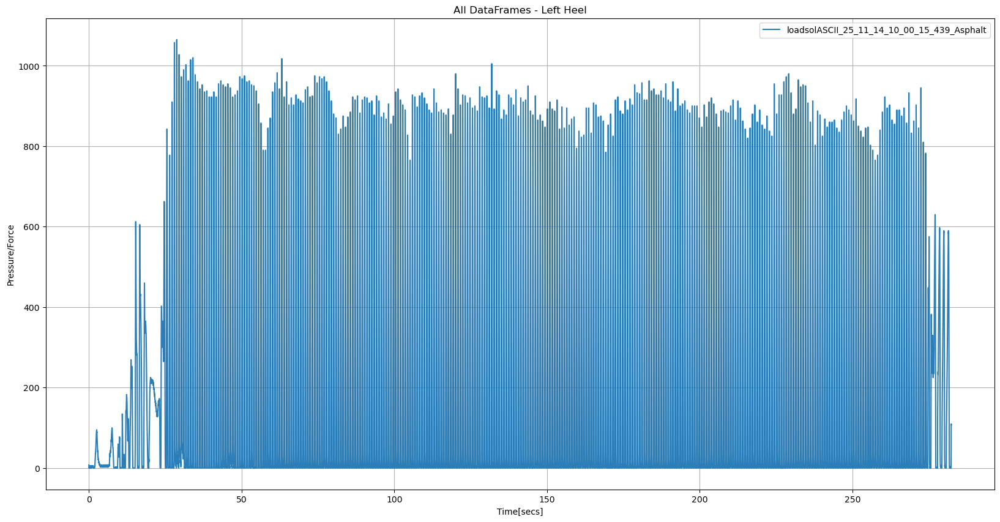


Time[secs]
P2X121_L_Forefoot


In [45]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][1]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)].copy()

list_of_dataframe_mask = list_of_dataframe_mask.iloc[4:5]


number_alpha = 1

plt.figure(figsize=(20, 10))

for row in list_of_dataframe_mask.itertuples():
    df = globals()[row.category]
    number_alpha -= 0.05
    x = df.columns[0]
    y = df.columns[2]
    plt.plot(
        df[x],
        df[y],
        alpha = number_alpha,
        label = f"{row.category}",
    
    )
plt.xlabel("Time[secs]")
plt.ylabel("Pressure/Force")
plt.title("All DataFrames - Left Heel")
plt.legend()
plt.grid(True)
plt.show()
print()
print(x)
print(y)

In [46]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][1]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)].copy()
len(list_of_dataframe_mask.columns)

1

In [47]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][1]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)].copy()



plt.figure(figsize=(20, 10))
df_2 = pd.DataFrame({
    'َA': [],
    'B': []})

for row in list_of_dataframe_mask.itertuples():
    df = globals()[row.category]
    df_1 = pd.DataFrame({'َA': [str(row.category)],'B': [str(len(df.columns))]})
    frames=[df_2,df_1]
    df_2 = pd.concat(frames)

df_2

,َA,B
0,loadsolASCII_25_11_11_09_38_11_074_Asphalt,10
0,loadsolASCII_25_11_11_14_21_20_634_Asphalt,10
0,loadsolASCII_25_11_13_10_16_07_282_Asphalt,10
0,loadsolASCII_25_11_13_14_44_02_331_Asphalt,10
0,loadsolASCII_25_11_14_10_00_15_439_Asphalt,8
0,loadsolASCII_25_11_16_14_07_55_722_Asphalt,10
0,loadsolASCII_25_11_17_10_09_36_341_Asphalt,8


<Figure size 2000x1000 with 0 Axes>

In [48]:
loadsolASCII_25_11_17_10_09_36_341_Asphalt.head()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
0,0.00,160.65,630.00,790.65,0.00,2.5,0.0,2.5
1,0.01,148.05,642.60,790.65,0.01,0.0,0.0,0.0
2,0.02,129.15,661.50,790.65,0.02,0.0,0.0,0.0
3,0.03,113.40,677.25,790.65,0.03,0.0,0.0,0.0
4,0.04,94.50,686.70,781.20,0.04,0.0,0.0,0.0


In [49]:
loadsolASCII_25_11_17_10_09_36_341_Asphalt.isnull().sum()

Time[secs]           0
P2X121_L_Heel        0
P2X121_L_Forefoot    0
P2X121_L             0
Time[secs].1         0
P2X118_R_Forefoot    0
P2X118_R_Heel        0
P2X118_R             0
dtype: int64

In [50]:
loadsolASCII_25_11_17_10_09_36_341_Asphalt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46891 entries, 0 to 46890
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Time[secs]         46891 non-null  float64
 1   P2X121_L_Heel      46891 non-null  float64
 2   P2X121_L_Forefoot  46891 non-null  float64
 3   P2X121_L           46891 non-null  float64
 4   Time[secs].1       46891 non-null  float64
 5   P2X118_R_Forefoot  46891 non-null  float64
 6   P2X118_R_Heel      46891 non-null  float64
 7   P2X118_R           46891 non-null  float64
dtypes: float64(8)
memory usage: 2.9 MB


In [51]:
loadsolASCII_25_11_17_10_09_36_341_Asphalt.describe()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
count,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000
mean,234.450000,122.088640,287.035254,409.123894,234.450000,273.575882,109.458870,383.034753
std,135.364101,235.509535,437.188158,545.038291,135.364101,445.847087,199.963349,526.103476
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,117.225000,0.000000,0.000000,0.000000,117.225000,0.000000,0.000000,0.000000
50%,234.450000,0.000000,27.450000,69.920000,234.450000,15.000000,0.000000,34.860000
75%,351.675000,127.400000,371.850000,714.645000,351.675000,367.345000,145.810000,664.955000
max,468.900000,1990.000000,1740.000000,2491.480000,468.900000,1812.500000,1345.620000,1834.250000


In [52]:
print(f"Left Heel force: {loadsolASCII_25_11_17_10_09_36_341_Asphalt["P2X121_L_Heel"].sum()}")
print(f"Right Heel force: {loadsolASCII_25_11_17_10_09_36_341_Asphalt["P2X118_R_Heel"].sum()}")

Left Heel force: 5724858.42
Right Heel force: 5132635.89


In [53]:
print(f"Left Forefoot force: {loadsolASCII_25_11_17_10_09_36_341_Asphalt["P2X121_L_Forefoot"].sum()}")
print(f"Right Forefoot force: {loadsolASCII_25_11_17_10_09_36_341_Asphalt["P2X118_R_Forefoot"].sum()}")

Left Forefoot force: 13459370.080000002
Right Forefoot force: 12828246.7


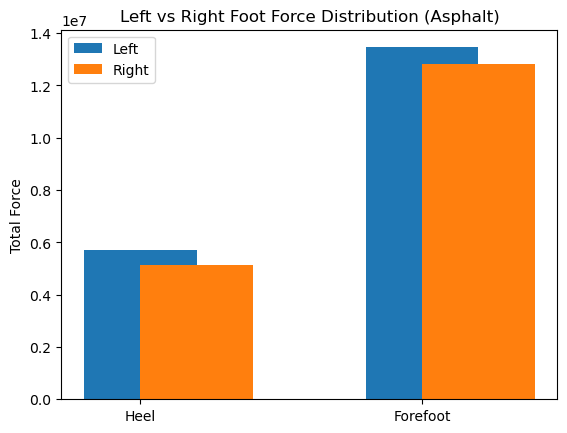

In [54]:
labels = ["Heel", "Forefoot"]
left = [5724858.42, 13459370.08]
right = [5132635.89, 12828246.7]

x = range(len(labels))

plt.bar(x, left, width=0.4, label="Left", align="center")
plt.bar(x, right, width=0.4, label="Right", align="edge")

plt.xticks(x, labels)
plt.ylabel("Total Force")
plt.title("Left vs Right Foot Force Distribution (Asphalt)")
plt.legend()
plt.show()

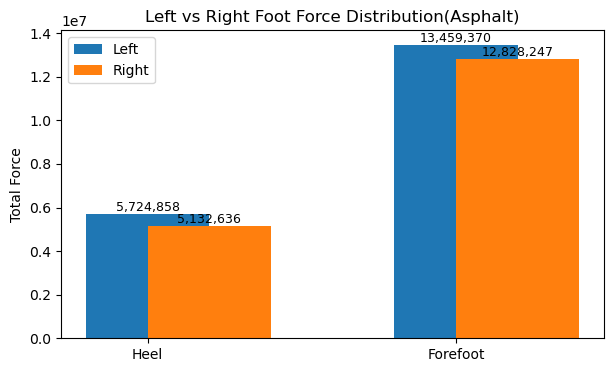

In [55]:
labels = ["Heel", "Forefoot"]
left = [5724858.42, 13459370.08]
right = [5132635.89, 12828246.7]

x = range(len(labels))

plt.figure(figsize=(7,4))
bars_left = plt.bar(x, left, width=0.4, label="Left", align="center")
bars_right = plt.bar(x, right, width=0.4, label="Right", align="edge")

plt.xticks(x, labels)
plt.ylabel("Total Force")
plt.title("Left vs Right Foot Force Distribution(Asphalt)")
plt.legend()

# عدد روی ستون‌ها
for bars in [bars_left, bars_right]:
    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h,
            f"{h:,.0f}",
            ha="center",
            va="bottom",
            fontsize=9
        )

plt.show()

In [56]:
loadsolASCII_25_11_17_10_09_36_341_Asphalt.describe()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
count,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000,46891.000000
mean,234.450000,122.088640,287.035254,409.123894,234.450000,273.575882,109.458870,383.034753
std,135.364101,235.509535,437.188158,545.038291,135.364101,445.847087,199.963349,526.103476
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,117.225000,0.000000,0.000000,0.000000,117.225000,0.000000,0.000000,0.000000
50%,234.450000,0.000000,27.450000,69.920000,234.450000,15.000000,0.000000,34.860000
75%,351.675000,127.400000,371.850000,714.645000,351.675000,367.345000,145.810000,664.955000
max,468.900000,1990.000000,1740.000000,2491.480000,468.900000,1812.500000,1345.620000,1834.250000


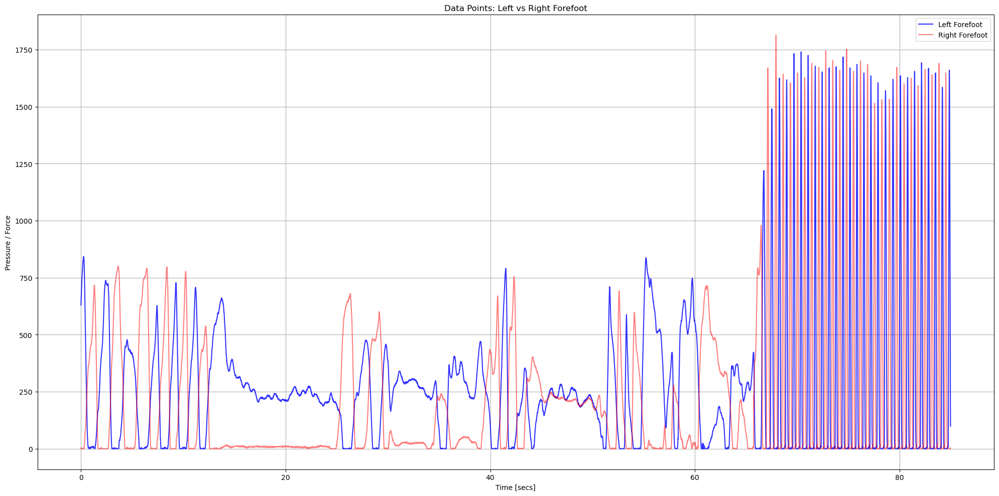

In [57]:
df_first = loadsolASCII_25_11_17_10_09_36_341_Asphalt.iloc[:8500]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Forefoot'],
         label='Left Forefoot', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Forefoot'],
         label='Right Forefoot', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Forefoot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

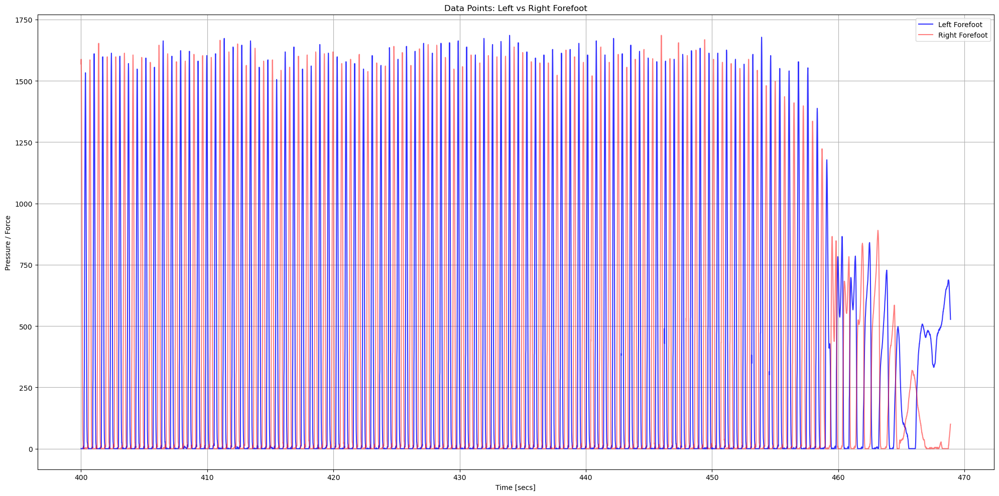

In [58]:
df_first = loadsolASCII_25_11_17_10_09_36_341_Asphalt.iloc[40000:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Forefoot'],
         label='Left Forefoot', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Forefoot'],
         label='Right Forefoot', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Forefoot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

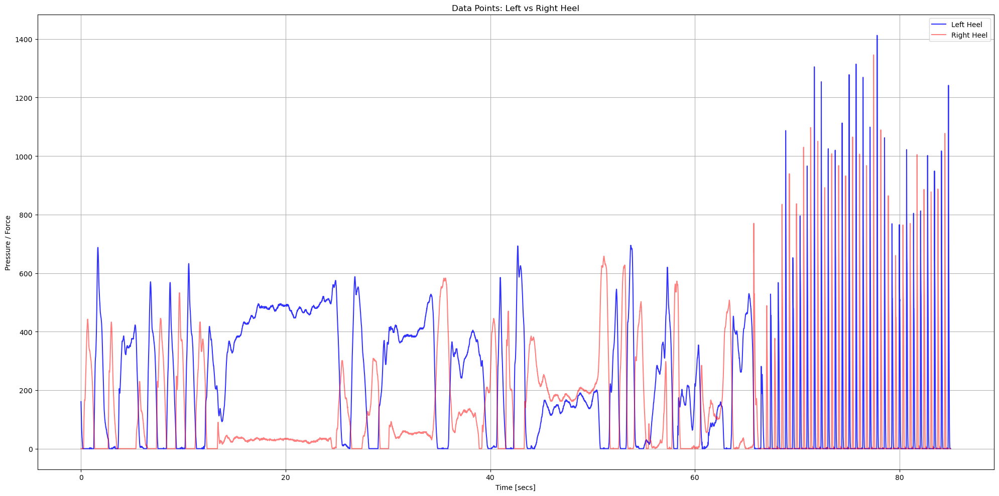

In [59]:
df_first = loadsolASCII_25_11_17_10_09_36_341_Asphalt.iloc[:8500]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Heel'],
         label='Left Heel', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Heel'],
         label='Right Heel', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

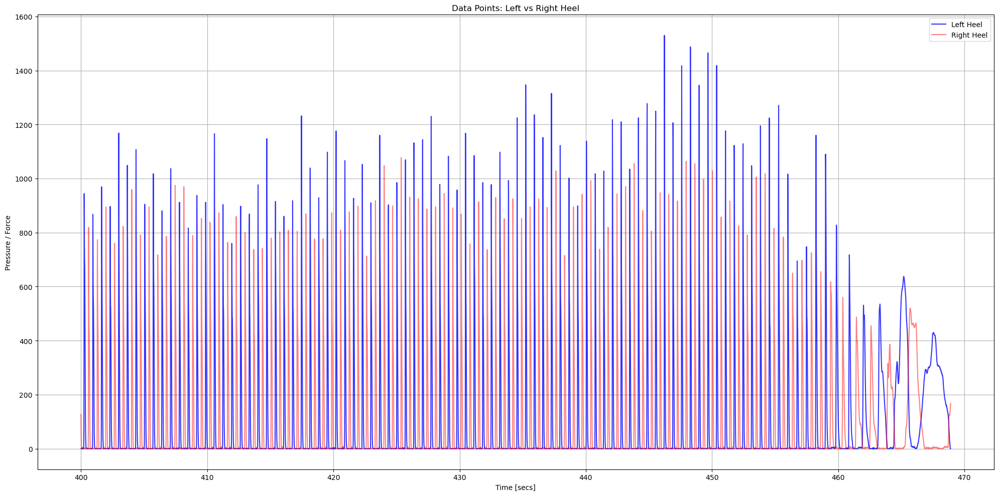

In [60]:
df_first = loadsolASCII_25_11_17_10_09_36_341_Asphalt.iloc[40000:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Heel'],
         label='Left Heel', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Heel'],
         label='Right Heel', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [61]:
loadsolASCII_25_11_17_10_09_36_341_Asphalt.head()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
0,0.00,160.65,630.00,790.65,0.00,2.5,0.0,2.5
1,0.01,148.05,642.60,790.65,0.01,0.0,0.0,0.0
2,0.02,129.15,661.50,790.65,0.02,0.0,0.0,0.0
3,0.03,113.40,677.25,790.65,0.03,0.0,0.0,0.0
4,0.04,94.50,686.70,781.20,0.04,0.0,0.0,0.0


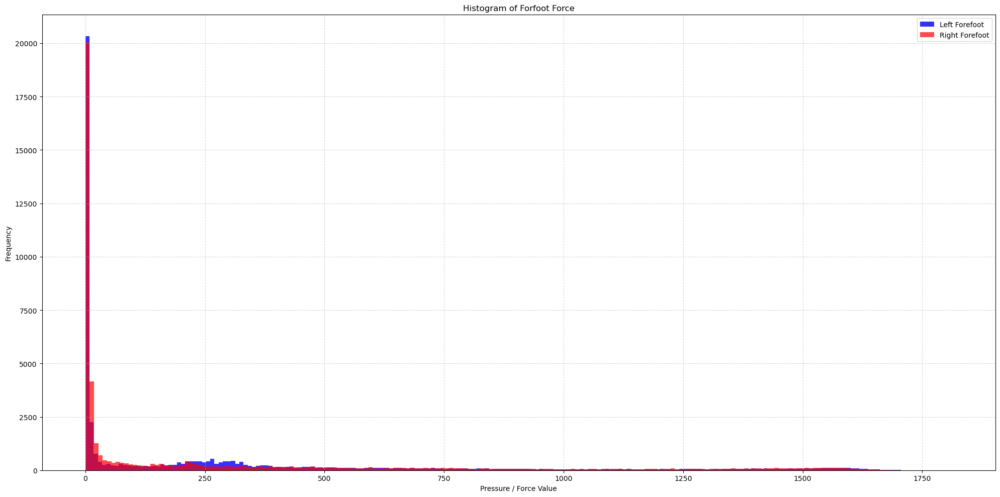

In [62]:
df = loadsolASCII_25_11_17_10_09_36_341_Asphalt

plt.figure(figsize=(20, 10))
plt.hist(df['P2X121_L_Forefoot'],
         bins=200, alpha=0.80,
         label='Left Forefoot',
         color='blue')

plt.hist(df['P2X118_R_Forefoot'],
         bins=200,
         alpha=0.70,
         label='Right Forefoot',
         color='red')

plt.xlabel('Pressure / Force Value')
plt.ylabel('Frequency')
plt.title('Histogram of Forfoot Force')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

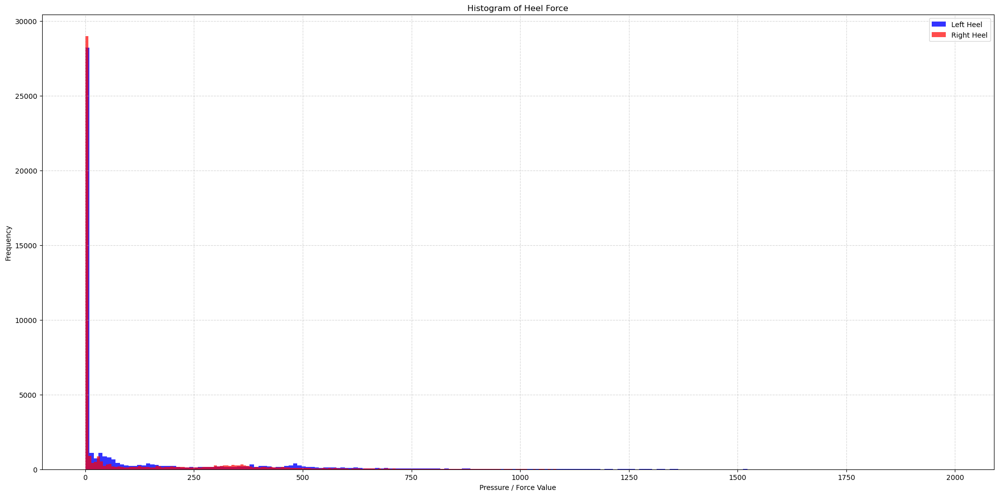

In [63]:
df = loadsolASCII_25_11_17_10_09_36_341_Asphalt

plt.figure(figsize=(20, 10))
plt.hist(df['P2X121_L_Heel'],
         bins=200, alpha=0.80,
         label='Left Heel',
         color='blue')

plt.hist(df['P2X118_R_Heel'],
         bins=200,
         alpha=0.70,
         label='Right Heel',
         color='red')

plt.xlabel('Pressure / Force Value')
plt.ylabel('Frequency')
plt.title('Histogram of Heel Force')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [64]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][4]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)]
list_of_dataframe_mask

,category
13,loadsolASCII_25_11_13_11_00_05_455_Forest
23,loadsolASCII_25_11_16_13_47_50_266_Forest
29,loadsolASCII_25_11_17_09_44_13_137_Forest
30,loadsolASCII_25_11_17_09_53_52_492_Forest


In [65]:
loadsolASCII_25_11_17_09_53_52_492_Forest.head()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
0,0.00,276.85,216.96,493.81,0.00,169.74,109.71,279.45
1,0.01,279.11,214.70,493.81,0.01,166.98,106.95,273.93
2,0.02,276.85,214.70,491.55,0.02,169.74,109.71,279.45
3,0.03,279.11,214.70,493.81,0.03,172.50,109.71,282.21
4,0.04,279.11,212.44,491.55,0.04,169.74,106.95,276.69


In [66]:
loadsolASCII_25_11_17_09_53_52_492_Forest.describe()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
count,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000
mean,353.625000,126.029327,288.346315,414.375642,353.625000,291.757223,91.985136,383.742359
std,204.169819,226.742098,451.626109,553.308691,204.169819,457.327517,189.822924,537.885225
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,176.812500,0.000000,0.000000,0.000000,176.812500,0.000000,0.000000,0.000000
50%,353.625000,0.000000,14.960000,31.800000,353.625000,17.460000,0.000000,26.200000
75%,530.437500,192.000000,372.352500,709.162500,530.437500,401.940000,76.545000,707.032500
max,707.250000,2377.500000,1735.000000,2681.820000,707.250000,1765.000000,1409.640000,1900.250000


In [67]:
loadsolASCII_25_11_17_09_53_52_492_Forest.sum().isnull()

Time[secs]           False
P2X121_L_Heel        False
P2X121_L_Forefoot    False
P2X121_L             False
Time[secs].1         False
P2X118_R_Forefoot    False
P2X118_R_Heel        False
P2X118_R             False
dtype: bool

In [68]:
loadsolASCII_25_11_17_09_53_52_492_Forest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70726 entries, 0 to 70725
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Time[secs]         70726 non-null  float64
 1   P2X121_L_Heel      70726 non-null  float64
 2   P2X121_L_Forefoot  70726 non-null  float64
 3   P2X121_L           70726 non-null  float64
 4   Time[secs].1       70726 non-null  float64
 5   P2X118_R_Forefoot  70726 non-null  float64
 6   P2X118_R_Heel      70726 non-null  float64
 7   P2X118_R           70726 non-null  float64
dtypes: float64(8)
memory usage: 4.3 MB


In [69]:
loadsolASCII_25_11_17_09_53_52_492_Forest.describe()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
count,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000,70726.000000
mean,353.625000,126.029327,288.346315,414.375642,353.625000,291.757223,91.985136,383.742359
std,204.169819,226.742098,451.626109,553.308691,204.169819,457.327517,189.822924,537.885225
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,176.812500,0.000000,0.000000,0.000000,176.812500,0.000000,0.000000,0.000000
50%,353.625000,0.000000,14.960000,31.800000,353.625000,17.460000,0.000000,26.200000
75%,530.437500,192.000000,372.352500,709.162500,530.437500,401.940000,76.545000,707.032500
max,707.250000,2377.500000,1735.000000,2681.820000,707.250000,1765.000000,1409.640000,1900.250000


In [70]:
print(f"Left Heel force: {loadsolASCII_25_11_17_09_53_52_492_Forest["P2X121_L_Heel"].sum()}")
print(f"Right Heel force: {loadsolASCII_25_11_17_09_53_52_492_Forest["P2X118_R_Heel"].sum()}")

Left Heel force: 8913550.170000002
Right Heel force: 6505740.76


In [71]:
print(f"Left Forefoot force: {loadsolASCII_25_11_17_09_53_52_492_Forest["P2X121_L_Forefoot"].sum()}")
print(f"Right Forefoot force: {loadsolASCII_25_11_17_09_53_52_492_Forest["P2X118_R_Forefoot"].sum()}")

Left Forefoot force: 20393581.47
Right Forefoot force: 20634821.33


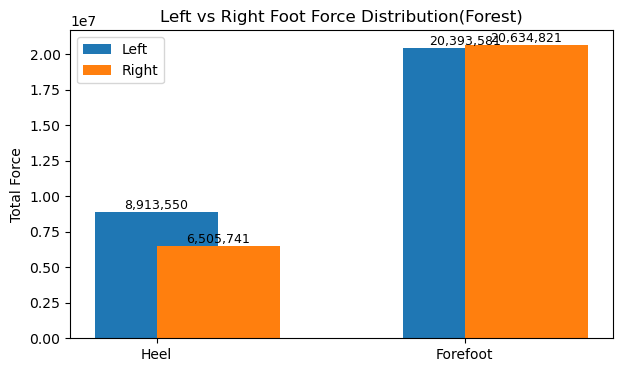

In [72]:
labels = ["Heel", "Forefoot"]
left = [8913550.170000002, 20393581.47]
right = [6505740.76, 20634821.33]

x = range(len(labels))

plt.figure(figsize=(7,4))
bars_left = plt.bar(x, left, width=0.4, label="Left", align="center")
bars_right = plt.bar(x, right, width=0.4, label="Right", align="edge")

plt.xticks(x, labels)
plt.ylabel("Total Force")
plt.title("Left vs Right Foot Force Distribution(Forest)")
plt.legend()

# عدد روی ستون‌ها
for bars in [bars_left, bars_right]:
    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h,
            f"{h:,.0f}",
            ha="center",
            va="bottom",
            fontsize=9
        )

plt.show()

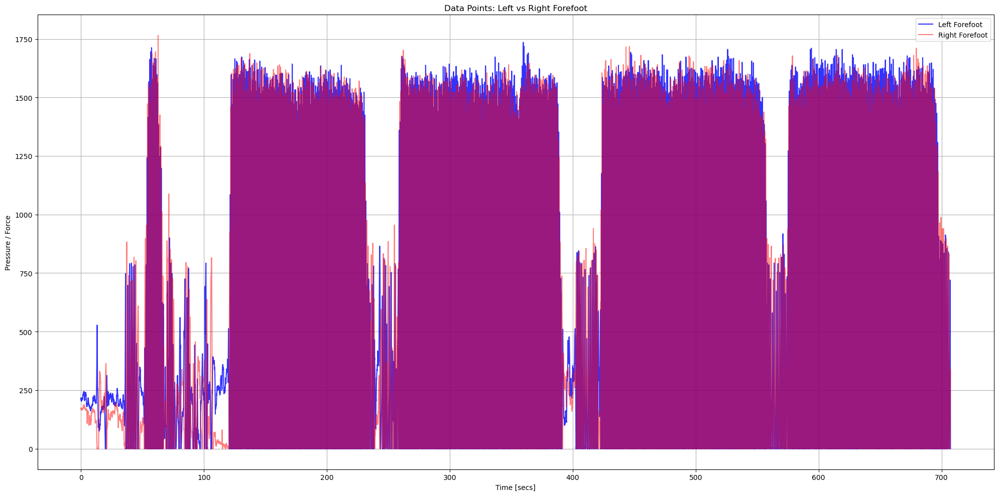

In [73]:
df_first = loadsolASCII_25_11_17_09_53_52_492_Forest.iloc[:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Forefoot'],
         label='Left Forefoot', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Forefoot'],
         label='Right Forefoot', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Forefoot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

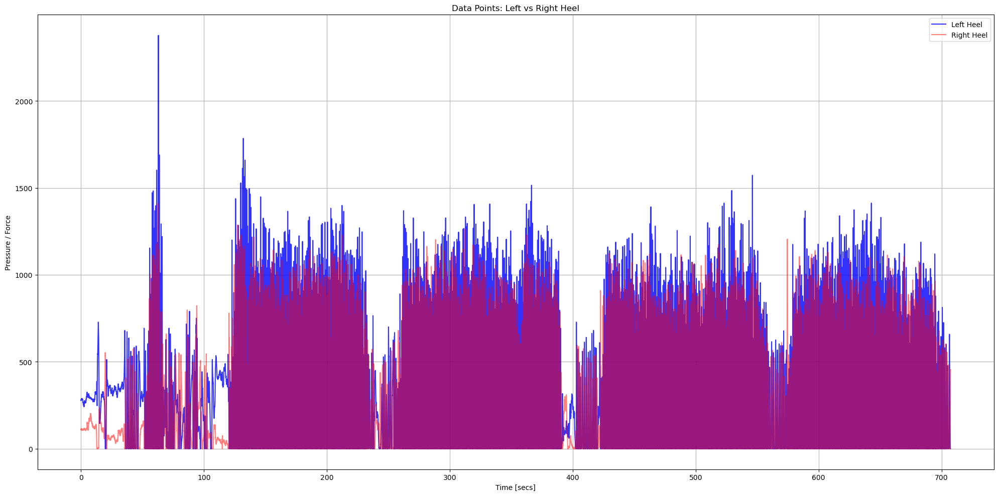

In [74]:
df_first = loadsolASCII_25_11_17_09_53_52_492_Forest.iloc[:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Heel'],
         label='Left Heel', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Heel'],
         label='Right Heel', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [75]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][3]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)]
list_of_dataframe_mask

,category
3,loadsolASCII_25_11_11_10_06_34_305_Grass
4,loadsolASCII_25_11_11_10_09_51_519_Grass
5,loadsolASCII_25_11_11_13_49_21_080_Grass
6,loadsolASCII_25_11_11_13_54_44_511_Grass
11,loadsolASCII_25_11_13_10_29_20_864_Grass
16,loadsolASCII_25_11_13_14_12_44_574_Grass
20,loadsolASCII_25_11_14_09_43_39_794_Grass
26,loadsolASCII_25_11_16_14_46_47_845_Grass
28,loadsolASCII_25_11_17_09_27_24_980_Grass


In [76]:
loadsolASCII_25_11_17_09_27_24_980_Grass.head()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
0,0.00,412.41,304.44,716.85,0.00,10.00,20.00,30.00
1,0.01,415.95,304.44,720.39,0.01,4.96,17.44,22.40
2,0.02,419.49,304.44,723.93,0.02,2.48,17.44,19.92
3,0.03,424.80,299.13,723.93,0.03,0.00,17.44,17.44
4,0.04,424.80,299.13,723.93,0.04,4.96,14.96,19.92


In [77]:
loadsolASCII_25_11_17_09_27_24_980_Grass.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66916 entries, 0 to 66915
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Time[secs]         66916 non-null  float64
 1   P2X121_L_Heel      66916 non-null  float64
 2   P2X121_L_Forefoot  66916 non-null  float64
 3   P2X121_L           66916 non-null  float64
 4   Time[secs].1       66915 non-null  float64
 5   P2X118_R_Forefoot  66915 non-null  float64
 6   P2X118_R_Heel      66915 non-null  float64
 7   P2X118_R           66915 non-null  float64
dtypes: float64(8)
memory usage: 4.1 MB


In [78]:
loadsolASCII_25_11_17_09_27_24_980_Grass.isnull().sum()

Time[secs]           0
P2X121_L_Heel        0
P2X121_L_Forefoot    0
P2X121_L             0
Time[secs].1         1
P2X118_R_Forefoot    1
P2X118_R_Heel        1
P2X118_R             1
dtype: int64

In [79]:
loadsolASCII_25_11_17_09_27_24_980_Grass.describe()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
count,66916.000000,66916.000000,66916.000000,66916.000000,66915.00000,66915.000000,66915.000000,66915.000000
mean,334.575000,143.324127,294.155723,437.479849,334.57000,259.991040,99.644959,359.635999
std,193.171296,208.457812,388.906117,485.682877,193.16841,390.576288,179.066354,477.907384
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,167.287500,0.000000,0.000000,2.500000,167.28500,2.490000,0.000000,2.500000
50%,334.575000,9.510000,165.050000,317.135000,334.57000,29.880000,2.500000,62.400000
75%,501.862500,241.200000,396.725000,723.467500,501.85500,344.675000,133.265000,594.100000
max,669.150000,1760.000000,1727.500000,2253.420000,669.14000,1787.500000,1617.500000,2122.160000


In [80]:
print(f"Left Heel force: {loadsolASCII_25_11_17_09_27_24_980_Grass["P2X121_L_Heel"].sum()}")
print(f"Right Heel force: {loadsolASCII_25_11_17_09_27_24_980_Grass["P2X118_R_Heel"].sum()}")

Left Heel force: 9590677.260000002
Right Heel force: 6667742.440000001


In [81]:
print(f"Left Forefoot force: {loadsolASCII_25_11_17_09_27_24_980_Grass["P2X121_L_Forefoot"].sum()}")
print(f"Right Forefoot force: {loadsolASCII_25_11_17_09_27_24_980_Grass["P2X118_R_Forefoot"].sum()}")

Left Forefoot force: 19683724.330000002
Right Forefoot force: 17397300.41


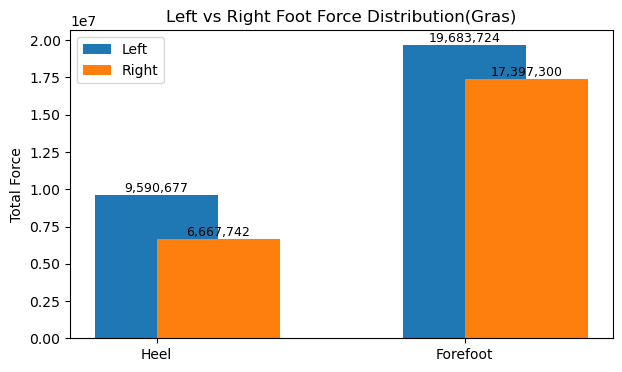

In [82]:
labels = ["Heel", "Forefoot"]
left = [9590677.260000002, 19683724.330000002]
right = [6667742.440000001, 17397300.41]

x = range(len(labels))

plt.figure(figsize=(7,4))
bars_left = plt.bar(x, left, width=0.4, label="Left", align="center")
bars_right = plt.bar(x, right, width=0.4, label="Right", align="edge")

plt.xticks(x, labels)
plt.ylabel("Total Force")
plt.title("Left vs Right Foot Force Distribution(Gras)")
plt.legend()

# عدد روی ستون‌ها
for bars in [bars_left, bars_right]:
    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h,
            f"{h:,.0f}",
            ha="center",
            va="bottom",
            fontsize=9
        )

plt.show()

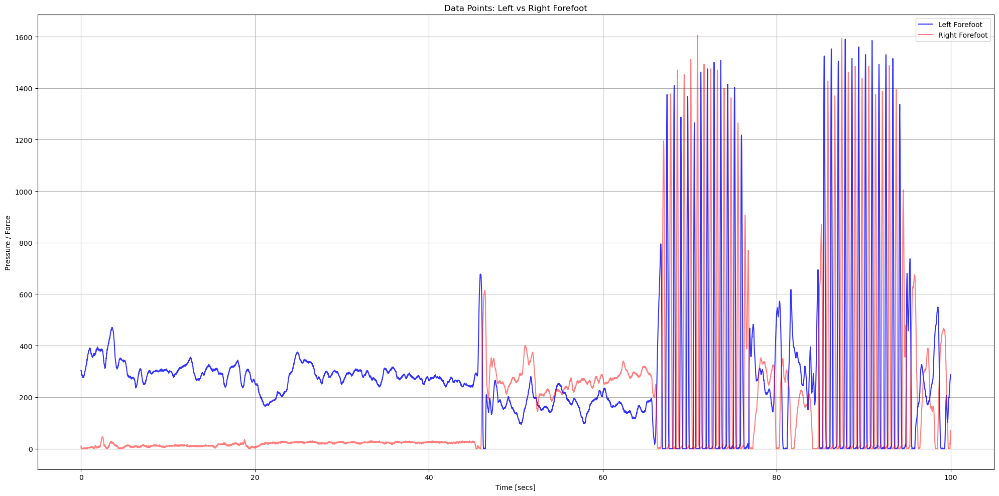

In [83]:
df_first = loadsolASCII_25_11_17_09_27_24_980_Grass.iloc[:10000]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Forefoot'],
         label='Left Forefoot', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Forefoot'],
         label='Right Forefoot', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Forefoot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

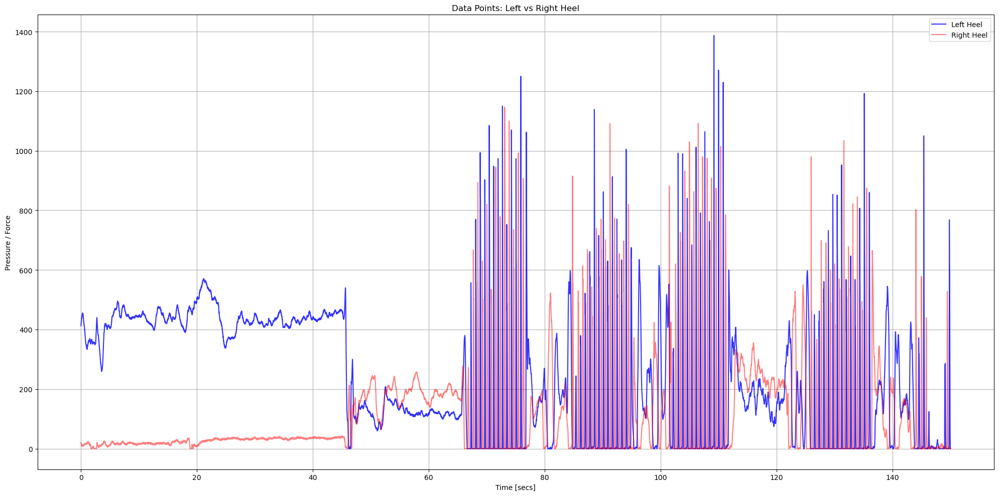

In [84]:
df_first = loadsolASCII_25_11_17_09_27_24_980_Grass.iloc[:15000]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Heel'],
         label='Left Heel', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Heel'],
         label='Right Heel', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

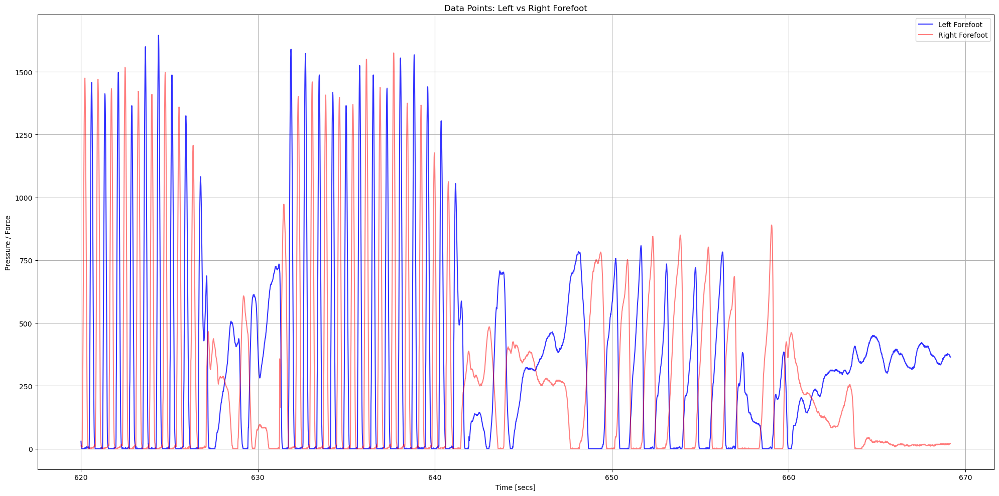

In [85]:
df_first = loadsolASCII_25_11_17_09_27_24_980_Grass.iloc[62000:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Forefoot'],
         label='Left Forefoot', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Forefoot'],
         label='Right Forefoot', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Forefoot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

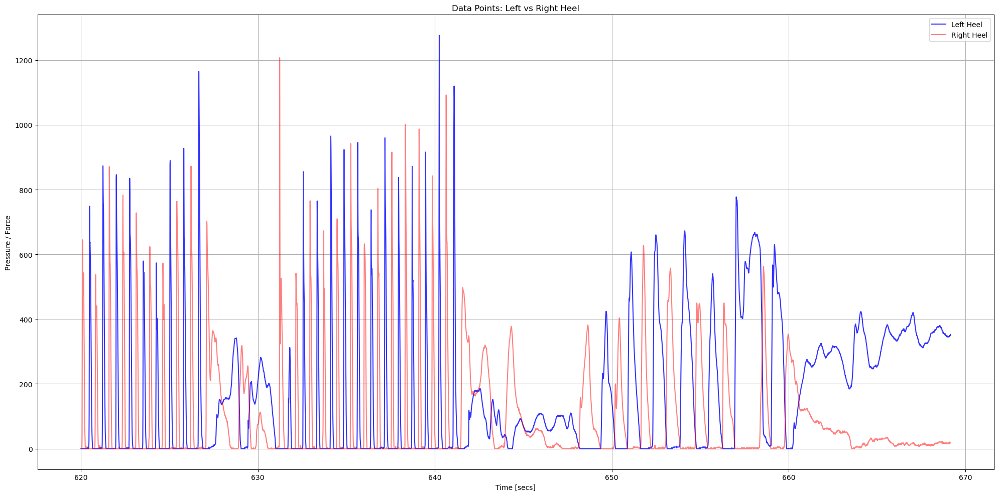

In [86]:
df_first = loadsolASCII_25_11_17_09_27_24_980_Grass.iloc[62000:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Heel'],
         label='Left Heel', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Heel'],
         label='Right Heel', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [87]:
list_of_dataframe = pd.DataFrame(list_name_dataframe, columns=["category"])
category = pd.DataFrame(["Gravel", "Asphalt", "Sand", "Grass", "Forest", "Wood"],columns=["category"])
mask = category["category"][2]
list_of_dataframe_mask = list_of_dataframe[list_of_dataframe["category"].str.contains(mask, na=False)]
list_of_dataframe_mask

,category
2,loadsolASCII_25_11_11_09_52_01_474_Sand
7,loadsolASCII_25_11_11_14_09_23_595_Sand
12,loadsolASCII_25_11_13_10_45_28_787_Sand
17,loadsolASCII_25_11_13_14_29_01_831_Sand
19,loadsolASCII_25_11_14_09_25_59_897_Sand
25,loadsolASCII_25_11_16_14_29_02_178_Sand
27,loadsolASCII_25_11_17_09_15_09_073_Sand


In [88]:
loadsolASCII_25_11_17_09_15_09_073_Sand.head()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
0,0.00,221.56,286.52,508.08,0.00,196.94,122.12,319.06
1,0.01,219.24,286.52,505.76,0.01,196.94,122.12,319.06
2,0.02,216.92,286.52,503.44,0.02,196.94,124.70,321.64
3,0.03,216.92,290.00,506.92,0.03,199.52,124.70,324.22
4,0.04,214.60,286.52,501.12,0.04,199.52,127.28,326.80


In [89]:
loadsolASCII_25_11_17_09_15_09_073_Sand.isnull().sum()

Time[secs]           1
P2X121_L_Heel        1
P2X121_L_Forefoot    1
P2X121_L             1
Time[secs].1         0
P2X118_R_Forefoot    0
P2X118_R_Heel        0
P2X118_R             0
dtype: int64

In [90]:
loadsolASCII_25_11_17_09_15_09_073_Sand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44911 entries, 0 to 44910
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Time[secs]         44910 non-null  float64
 1   P2X121_L_Heel      44910 non-null  float64
 2   P2X121_L_Forefoot  44910 non-null  float64
 3   P2X121_L           44910 non-null  float64
 4   Time[secs].1       44911 non-null  float64
 5   P2X118_R_Forefoot  44911 non-null  float64
 6   P2X118_R_Heel      44911 non-null  float64
 7   P2X118_R           44911 non-null  float64
dtypes: float64(8)
memory usage: 2.7 MB


In [91]:
loadsolASCII_25_11_17_09_15_09_073_Sand.describe()

,Time[secs],P2X121_L_Heel,P2X121_L_Forefoot,P2X121_L,Time[secs].1,P2X118_R_Forefoot,P2X118_R_Heel,P2X118_R
count,44910.000000,44910.000000,44910.000000,44910.000000,44911.000000,44911.000000,44911.000000,44911.000000
mean,224.545000,126.110314,298.895983,425.006297,224.550000,298.344510,104.148262,402.492772
std,129.645446,231.877787,439.873628,539.486636,129.648333,449.613733,208.518820,533.372855
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,112.272500,0.000000,0.000000,2.242500,112.275000,0.000000,0.000000,2.310000
50%,224.545000,2.450000,25.000000,66.920000,224.550000,24.960000,0.000000,49.920000
75%,336.817500,177.390000,447.062500,731.440000,336.825000,449.540000,106.575000,729.445000
max,449.090000,2127.500000,1805.000000,2561.510000,449.100000,2037.500000,1472.500000,2045.650000


In [92]:
print(f"Left Heel force: {loadsolASCII_25_11_17_09_15_09_073_Sand["P2X121_L_Heel"].sum()}")
print(f"Right Heel force: {loadsolASCII_25_11_17_09_15_09_073_Sand["P2X118_R_Heel"].sum()}")

Left Heel force: 5663614.19
Right Heel force: 4677402.600000001


In [93]:
print(f"Left Forefoot force: {loadsolASCII_25_11_17_09_15_09_073_Sand["P2X121_L_Forefoot"].sum()}")
print(f"Right Forefoot force: {loadsolASCII_25_11_17_09_15_09_073_Sand["P2X118_R_Forefoot"].sum()}")

Left Forefoot force: 13423418.59
Right Forefoot force: 13398950.290000001


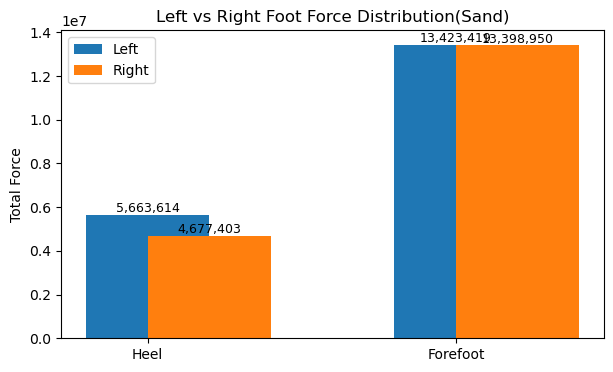

In [94]:
labels = ["Heel", "Forefoot"]
left = [5663614.19, 13423418.59]
right = [4677402.600000001, 13398950.290000001]

x = range(len(labels))

plt.figure(figsize=(7,4))
bars_left = plt.bar(x, left, width=0.4, label="Left", align="center")
bars_right = plt.bar(x, right, width=0.4, label="Right", align="edge")

plt.xticks(x, labels)
plt.ylabel("Total Force")
plt.title("Left vs Right Foot Force Distribution(Sand)")
plt.legend()

# عدد روی ستون‌ها
for bars in [bars_left, bars_right]:
    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h,
            f"{h:,.0f}",
            ha="center",
            va="bottom",
            fontsize=9
        )

plt.show()

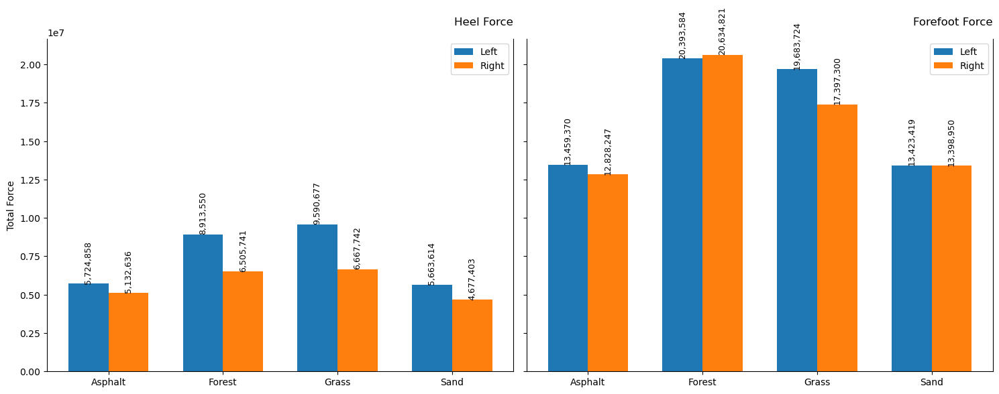

In [95]:


grounds = ['Asphalt', 'Forest', 'Grass', 'Sand']

heel_left = [5724858, 8913550, 9590677, 5663614]
heel_right = [5132636, 6505741, 6667742, 4677403]

forefoot_left = [13459370, 20393584, 19683724, 13423419]
forefoot_right = [12828247, 20634821, 17397300, 13398950]

max_force = max(
    max(heel_left), max(heel_right),
    max(forefoot_left), max(forefoot_right)
)

x = np.arange(len(grounds))
width = 0.35

fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

def add_labels(ax, bars):
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            height,
            f'{int(height):,}',
            ha='center',
            va='bottom',
            fontsize=9,
            rotation=90
        )

# ---- Heel ----
bars1 = axes[0].bar(x - width/2, heel_left, width, label='Left')
bars2 = axes[0].bar(x + width/2, heel_right, width, label='Right')

axes[0].set_title('Heel Force', loc='right', pad=15)
axes[0].set_xticks(x)
axes[0].set_xticklabels(grounds)
axes[0].set_ylabel('Total Force')
axes[0].set_ylim(0, max_force)
axes[0].legend()

add_labels(axes[0], bars1)
add_labels(axes[0], bars2)

# ---- Forefoot ----
bars3 = axes[1].bar(x - width/2, forefoot_left, width, label='Left')
bars4 = axes[1].bar(x + width/2, forefoot_right, width, label='Right')


axes[1].set_title('Forefoot Force', loc='right', pad=15)
axes[1].set_xticks(x)
axes[1].set_xticklabels(grounds)
axes[1].set_ylim(0, max_force)
axes[1].legend()




add_labels(axes[1], bars3)
add_labels(axes[1], bars4)


for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.set_ylim(0, max_force * 1.05)


plt.tight_layout()
plt.show()


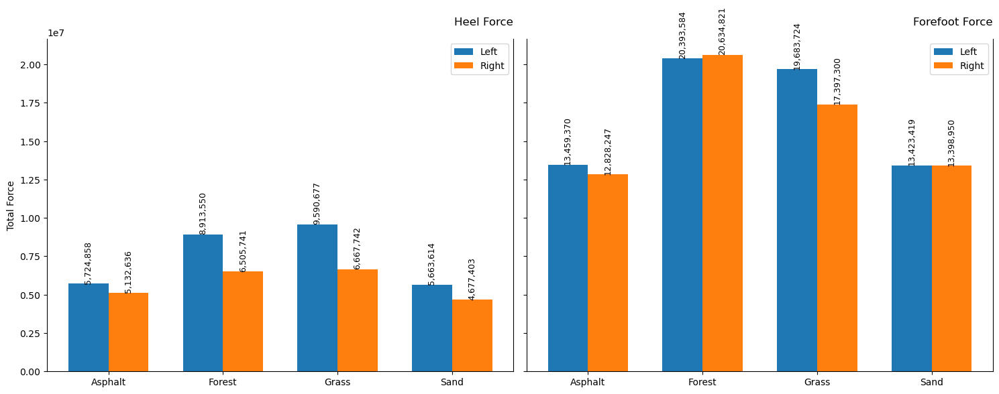

In [96]:


grounds = ['Asphalt', 'Forest', 'Grass', 'Sand']

heel_left = [5724858, 8913550, 9590677, 5663614]
heel_right = [5132636, 6505741, 6667742, 4677403]

forefoot_left = [13459370, 20393584, 19683724, 13423419]
forefoot_right = [12828247, 20634821, 17397300, 13398950]

max_force = max(
    max(heel_left), max(heel_right),
    max(forefoot_left), max(forefoot_right)
)

x = np.arange(len(grounds))
width = 0.35

fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

def add_labels(ax, bars):
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height,
            f'{int(height):,}',
            ha='center',
            va='bottom',
            fontsize=9,
            rotation=90
        )

# ---- Heel ----
bars1 = axes[0].bar(
    x - width / 2, heel_left, width,
    label='Left', color='tab:blue'
)
bars2 = axes[0].bar(
    x + width / 2, heel_right, width,
    label='Right', color='tab:orange'
)

axes[0].set_title('Heel Force', loc='right', pad=15)
axes[0].set_xticks(x)
axes[0].set_xticklabels(grounds)
axes[0].set_ylabel('Total Force')
axes[0].set_ylim(0, max_force)
axes[0].legend()

add_labels(axes[0], bars1)
add_labels(axes[0], bars2)

# ---- Forefoot ----
bars3 = axes[1].bar(
    x - width / 2, forefoot_left, width,
    label='Left', color='tab:blue'
)
bars4 = axes[1].bar(
    x + width / 2, forefoot_right, width,
    label='Right', color='tab:orange'
)

axes[1].set_title('Forefoot Force', loc='right', pad=15)
axes[1].set_xticks(x)
axes[1].set_xticklabels(grounds)
axes[1].set_ylim(0, max_force)
axes[1].legend()

add_labels(axes[1], bars3)
add_labels(axes[1], bars4)

for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.set_ylim(0, max_force * 1.05)

plt.tight_layout()
plt.show()


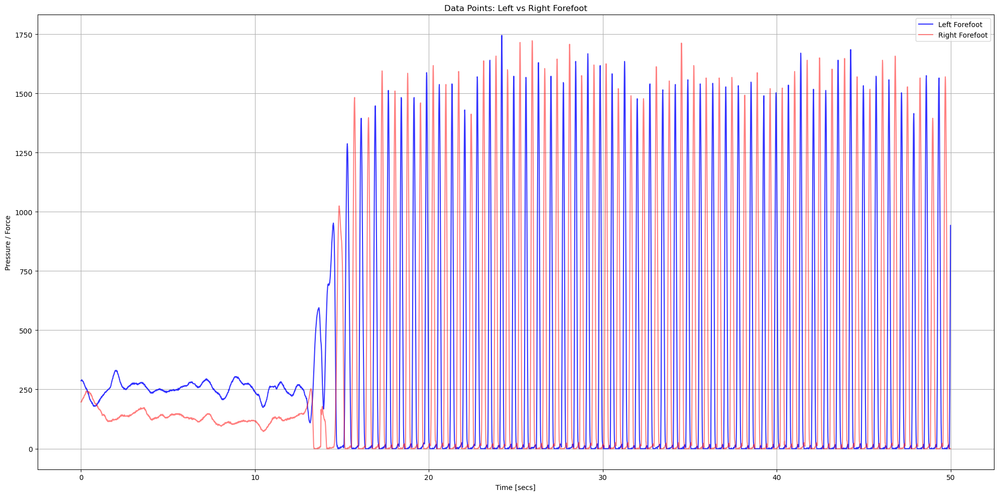

In [97]:
df_first = loadsolASCII_25_11_17_09_15_09_073_Sand.iloc[:5000]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Forefoot'],
         label='Left Forefoot', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Forefoot'],
         label='Right Forefoot', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Forefoot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

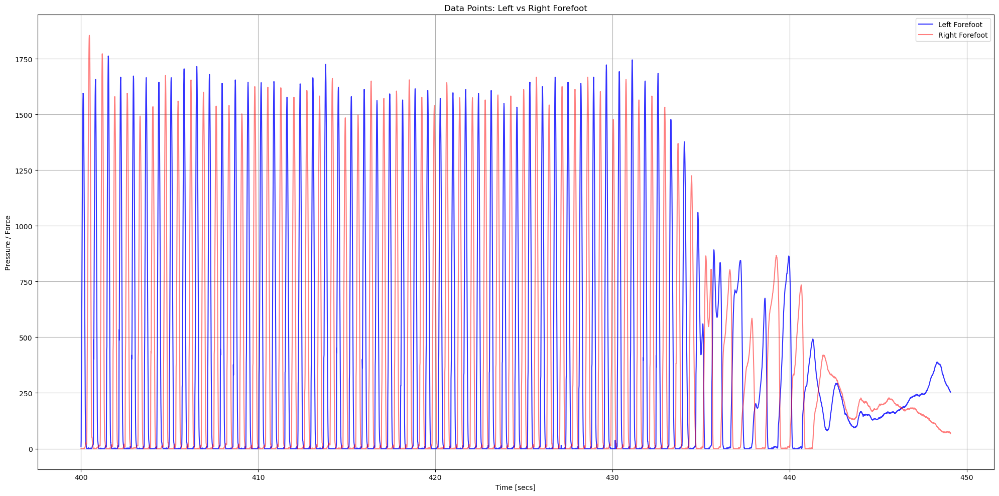

In [98]:
df_first = loadsolASCII_25_11_17_09_15_09_073_Sand.iloc[40000:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Forefoot'],
         label='Left Forefoot', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Forefoot'],
         label='Right Forefoot', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Forefoot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

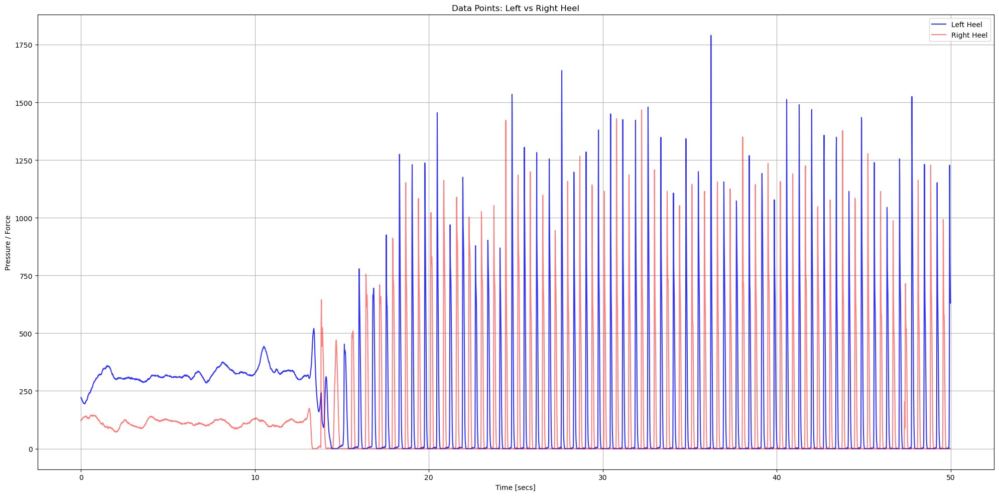

In [99]:
df_first = loadsolASCII_25_11_17_09_15_09_073_Sand.iloc[:5000]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Heel'],
         label='Left Heel', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Heel'],
         label='Right Heel', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

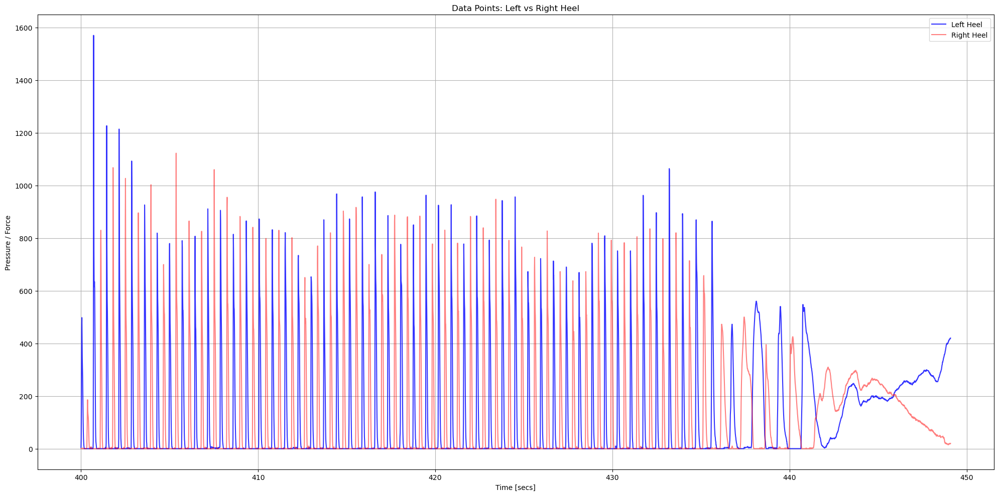

In [100]:
df_first = loadsolASCII_25_11_17_09_15_09_073_Sand.iloc[40000:]

plt.figure(figsize=(20, 10))

plt.plot(df_first['Time[secs]'],
         df_first['P2X121_L_Heel'],
         label='Left Heel', color='blue', alpha=0.80)

plt.plot(df_first['Time[secs]'],
         df_first['P2X118_R_Heel'],
         label='Right Heel', color='red',alpha=0.50)

plt.xlabel('Time [secs]')
plt.ylabel('Pressure / Force')
plt.title('Data Points: Left vs Right Heel')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()